# CSE 252A Computer Vision I Fall 2020 - Assignment 4

## Instructor: David Kriegman
### Assignment Published On: Tuesday, December 1, 2020
### Due On: Friday, December 11, 2020 11:59 pm

## Instructions

* Review the academic integrity and collaboration policies on the course website.
* This assignment must be completed individually.
* This assignment contains theoretical and programming exercises. If you plan to submit handwritten answers for the theoretical exercises, please be sure that your writing is readable (illegible answers will not be given the benefit of the doubt!) and merge your handwritten solutions in problem order with the PDF that you create from this notebook. You can also write the answers within the notebook itself by creating Markdown cells.
* Programming aspects of this assignment must be completed using Python in this notebook.
* If you want to modify the skeleton code, you can do so. The existing code is merely meant to provide you with a framework for your solution.
* You may use Python packages for basic linear algebra (you can use NumPy or SciPy for basic operations), but you may not use packages that directly solve the problem.
* If you are unsure about using a specific package or function, then ask the instructor and teaching assistants for clarification.
* You must submit to Gradescope: 
    * (1) This notebook exported as a `.pdf` file (including any handwritten solutions scanned and merged into the PDF, if applicable).
    * (2) This notebook as an `.ipynb` file. 
* You must select the pages associated with each problem on Gradescope (for your PDF submission).
* **Late policy:** Assignments submitted late will receive a 10% grade reduction for each day late (e.g. an assignment submitted an hour after the due date will receive a 10% penalty, an assignment submitted 10 hours after the due date will receive a 10% penalty, and an assignment submitted 28 hours after the due date will receive a 20% penalty). Assignments will not be accepted 72 hours after the due date. If you require an extension (for personal reasons only), you must request one as far in advance as possible. Extensions requested close to or after the due date will only be granted for clear emergencies or clearly unforeseeable circumstances.

## Problem 1: Optical Flow [14 pts]

In this problem, the multi-resolution Lucas-Kanade algorithm for estimating optical flow will be implemented, and the data needed for this problem can be found in the folder 'optical_flow_images'.

An example optical flow output is shown below - this is not a solution, just an example output.

**Note 1**: You can choose to implement a single scale version of Lucas-Kanade instead of multi-scale for partial credit in part 1. 

**Note 2**: You are free to use either multi-scale or single-scale version to complete part 3 and part 4 without incurring any penalty. 


![title](optical_flow_images/sample_image.png)

### Part 1: Multi-resolution Lucas-Kanade implementation [6 pts]

Implement the Lucas-Kanade method for estimating optical flow. The function 'LucasKanadeMultiScale' needs to be completed. You can use 'upsample_flow' and 'OpticalFlowRefine' as 2 building blocks in order to complete this.

In [48]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve, convolve2d
from scipy.ndimage.filters import gaussian_filter
from scipy.signal import convolve
from skimage.transform import resize
from scipy.signal import convolve, convolve2d
# from tqdm import tqdm_notebook

def gradient(image):
    kh = np.array([[1,0,-1]])
    kv = np.array([[1],[0],[-1]])
    gX = convolve2d(image, kh, mode = 'same')
    gY = convolve2d(image, kv, mode = 'same')
    return gX, gY

def grayscale(img):
    '''
    Converts RGB image to Grayscale
    '''
    gray=np.zeros((img.shape[0],img.shape[1]))
    gray=img[:,:,0]*0.2989+img[:,:,1]*0.5870+img[:,:,2]*0.1140
    return gray

def plot_optical_flow(img0,img1,U,V,titleStr, color=False):
    '''
    Plots optical flow given U,V and the images
    '''
    # Change t if required, affects the number of arrows
    # t should be between 1 and min(U.shape[0],U.shape[1])
    t=8
    # Subsample U and V to get visually pleasing output
    U1 = U[::t,::t]
    V1 = V[::t,::t]
    
    # Create meshgrid of subsampled coordinates
    r, c = img0.shape[0],img0.shape[1]
    cols,rows = np.meshgrid(np.linspace(0,c-1,c), np.linspace(0,r-1,r))
    cols = cols[::t,::t]
    rows = rows[::t,::t]
    
    # Plot optical flow
    plt.figure(figsize=(20,20))
    plt.subplot(121)
    plt.imshow(img0, alpha=0.5)
    plt.imshow(img1, alpha=0.5)
    plt.title('Overlayed Images')
    plt.subplot(122)
    if color:
        plt.imshow(img0)
    else:
        plt.imshow(grayscale(img0), cmap='gray')
    plt.quiver(cols,rows,U1,V1)
    plt.title(titleStr)
    plt.show()
    

images=[]
for i in range(1,5):
    images.append(plt.imread('optical_flow_images/im'+str(i)+'.png')[:,:288,:])
# each image after converting to gray scale is of size -> 400x288

In [49]:
# you can use interpolate from scipy
# You can implement 'upsample_flow' and 'OpticalFlowRefine' 
# as 2 building blocks in order to complete this.
import scipy.misc
from scipy.signal import convolve2d
from skimage.transform import resize
def upsample_flow(u_prev, v_prev):
    ''' You may implement this method to upsample optical flow from
    previous level
    u_prev, v_prev -> optical flow from prev level
    u, v -> upsampled optical flow to the current level
    '''
    if u_prev is None and v_prev is None:
        return u_prev, v_prev
    u = resize(u_prev,(u_prev.shape[0]*2,u_prev.shape[1]*2),order=1)
    v = resize(v_prev,(u_prev.shape[0]*2,u_prev.shape[1]*2),order=1)
    u = u*2;
    v = v*2;
    return u, v

In [50]:
def warp(im, u_prev, v_prev):
    warpedIm = np.zeros(im.shape)
    for i in range(0, im.shape[0]):
        for j in range(0,im.shape[1]):
            x = np.rint(i+v_prev[i,j]).astype(np.int)
            y = np.rint(j+u_prev[i,j]).astype(np.int)
            #x = np.rint(i+u_prev[i,j]).astype(int)
            #y = np.rint(j+v_prev[i,j]).astype(int)
            #if(x-i != 0): print('x: ', x-i, 'i,j = ', i,j)
            #if(y-j != 0): print('y: ', y-j, 'i,j = ', i,j)
            if (0<=x) and (x<im.shape[0]) and (0<=y) and (y<im.shape[1]):
                warpedIm[i,j] = im[x, y]
    return warpedIm

def It_patch(im2, im1, u_prev, v_prev, i, j, sub, add): 
    #lower and upper bounds
    #i and j are the placed it is cetnered on
    #shift entire patch by the u_prev and v_prev
    u_window = np.rint(u_prev[i,j]).astype(np.int)
    v_window = np.rint(v_prev[i,j]).astype(np.int)
    #Dims = [i-sub+v_window, i+add+v_window, j-sub+u_window, j+add+u_window]
    patch1 = im1[i-sub:i+add, j-sub:j+add]
    patch2 = im2[i-sub+v_window:i+add+v_window,
                 j-sub+u_window:j+add+u_window]
    It_patch = patch2 - patch1
    return It_patch

def Ix2(im, dim):
    gX, gY = gradient(im)
    result = gX*gX
    #each location in matrix has to be the summation over the entire window
    #convolve window at each location
    return gX, convolve2d(result, np.ones((dim,dim)), mode='same')
def Iy2(im, dim):
    gX, gY = gradient(im)
    result = gY*gY
    return gY, convolve2d(result, np.ones((dim,dim)), mode='same')
def IxIy(im, dim):
    gX, gY = gradient(im)
    result = gX*gY
    return convolve2d(result, np.ones((dim,dim)), mode='same')
    
def OpticalFlowRefine(im1,im2,window, u_prev=None, v_prev=None):
    '''
    Inputs: the two images at current level and window size
    u_prev, v_prev - previous levels optical flow
    Return u,v - optical flow at current level
    '''
    ############################# get u_prev and v_prev
    u, v = np.zeros(im1.shape), np.zeros(im1.shape)
    if u_prev is None and v_prev is None:
        u_prev, v_prev = np.zeros(im1.shape), np.zeros(im1.shape)
    u_prev = np.round(u_prev).astype(np.int)
    v_prev = np.round(v_prev).astype(np.int)
    
    ############################# get matrices of Ix^2, Iy^2, IxIy     
    Ix, Ix2Master = Ix2(im1, window)
    Iy, Iy2Master = Iy2(im1, window)
    IxIyMaster = IxIy(im1, window)
    
    sub = window//2
    add = window//2
    sz = im1.shape
    for i in range(sub, sz[0]-add-1 ):
        for j in range(sub, sz[1]-add-1):
            c = np.zeros((2,2))
            d = np.zeros((2,2))
            oM = np.zeros((2,1))
            if window%2 == 0:
                #wT - np.array(It[i-sub:i+add, j-sub:j+add])
                wX = np.array(Ix[i-sub:i+add, j-sub:j+add])
                wY = np.array(Iy[i-sub:i+add, j-sub:j+add])
                wT = It_patch(im2, im1, u_prev, v_prev, i, j, sub, add)    
            else:
                #wT = np.array(It[i-sub:i+add+1, j-sub:j+add+1])
                wX = np.array(Ix[i-sub:i+add, j-sub:j+add])
                wY = np.array(Iy[i-sub:i+add, j-sub:j+add])
                wT = It_patch(im2, im1, u_prev, v_prev, i, j, sub, add)
            
            c[0,0] = Ix2Master[i,j]
            c[0,1] = IxIyMaster[i,j]
            c[1,0] = IxIyMaster[i,j]
            c[1,1] = Iy2Master[i,j]
            
            #now to find the second matrix
            oM[0,0] = np.sum(-wX*wT)
            oM[1,0] = np.sum(-wY*wT)
            #print(oM[0,0], oM[1,0])
            uv = np.matmul(np.linalg.pinv(c), oM) ##PROMBLE, C IS SINGULAR
            u[i,j] = uv[0]
            v[i,j] = uv[1]
            nothing =0
    u = u + u_prev
    v = v + v_prev
    return u, v


In [51]:
def gaussian2d(filter_size=5, sig=1.0):
    """Creates a 2D Gaussian kernel with
    side length `filter_size` and a sigma of `sig`."""
    ax = np.arange(-filter_size // 2 + 1., filter_size // 2 + 1.)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-0.5 * (np.square(xx) + np.square(yy)) / np.square(sig))
    return kernel / np.sum(kernel)

def downSampleIm(im1, im2, level): #send it the level 1 through..5 (level 1 is fullsize)
    im1Down, im2Down = im1, im2
    for i in range(level-1):
        smooth1 = convolve2d(im1Down,gaussian2d(), mode='same')
        smooth2 = convolve2d(im2Down,gaussian2d(), mode='same')
        im1Down = smooth1[::2,::2]    
        im2Down = smooth2[::2,::2]
    return im1Down, im2Down

def LucasKanadeMultiScale(im1,im2,window, numLevels=2):
    '''
    Implement the multi-resolution Lucas kanade algorithm
    Inputs: the two images, window size and number of levels
    if numLevels = 1, then compute optical flow at only the given image level.
    Returns: u, v - the optical flow
    '''
    
    """ ==========
    YOUR CODE HERE
    ========== """
    # You can call OpticalFlowRefine iteratively
    im1Down, im2Down = downSampleIm(im1, im2, numLevels)
    u, v = OpticalFlowRefine(im1Down, im2Down, window)
    #u_prev, v_prev = u, v
    for lvl in range(numLevels -1): #starts at 0, goes through running on numLevels-2
        #u_prev, v_prev = u, v
        u_prev, v_prev = upsample_flow(u, v)
        im1Down, im2Down = downSampleIm(im1, im2, numLevels-lvl-1)
        u, v = OpticalFlowRefine(im1Down, im2Down, window, u_prev, v_prev)
        #u, v = u_prev+u_new, v_prev+v_new
    return u, v

### Part 2: Number of levels [2 pts]

Plot optical flow for the pair of images im1 and im2 for different number of levels mentioned below. Comment on the results and justify.<br>
(i) window size = 13, numLevels = 1<br>
(ii) window size = 13, numLevels = 3<br>
(iii) window size = 13, numLevels = 5<br>
So, you are expected to provide 3 outputs here<br>

Note: if numLevels = 1, then it means the optical flow is only computed at the image resolution i.e. no downsampling

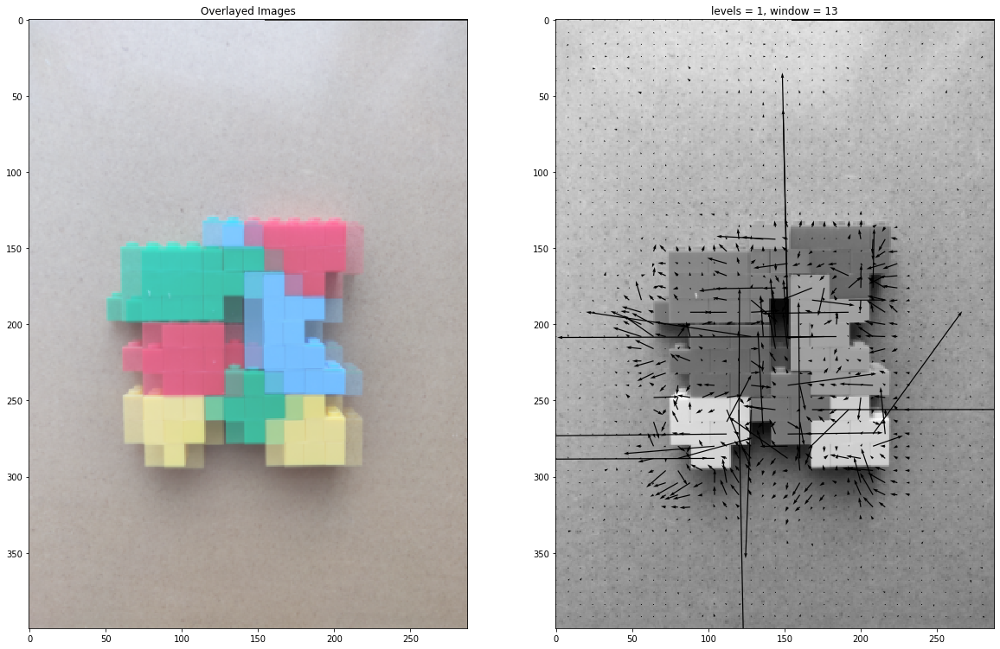

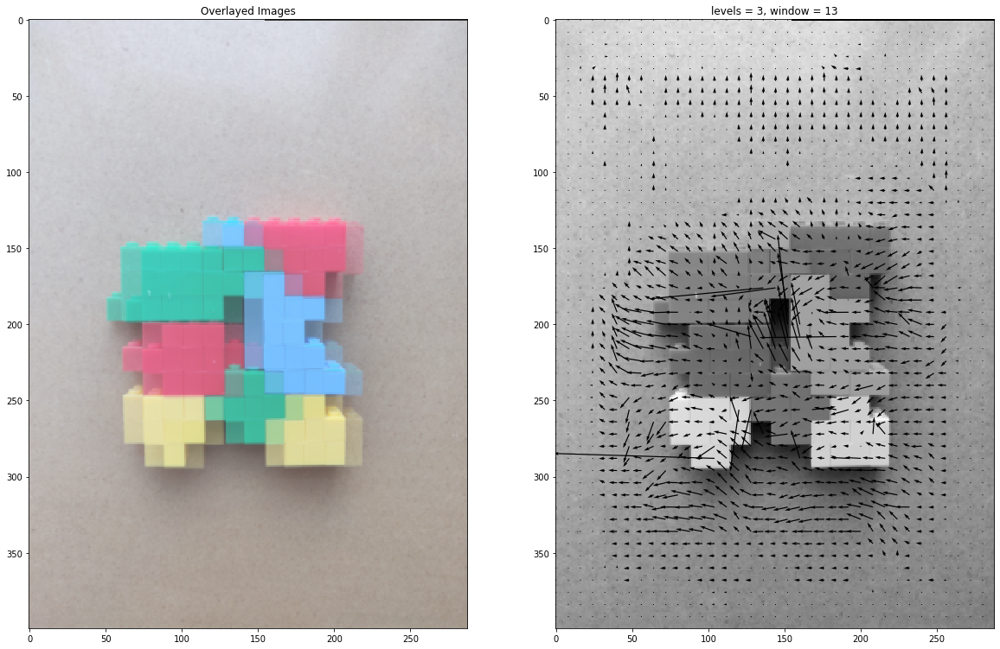

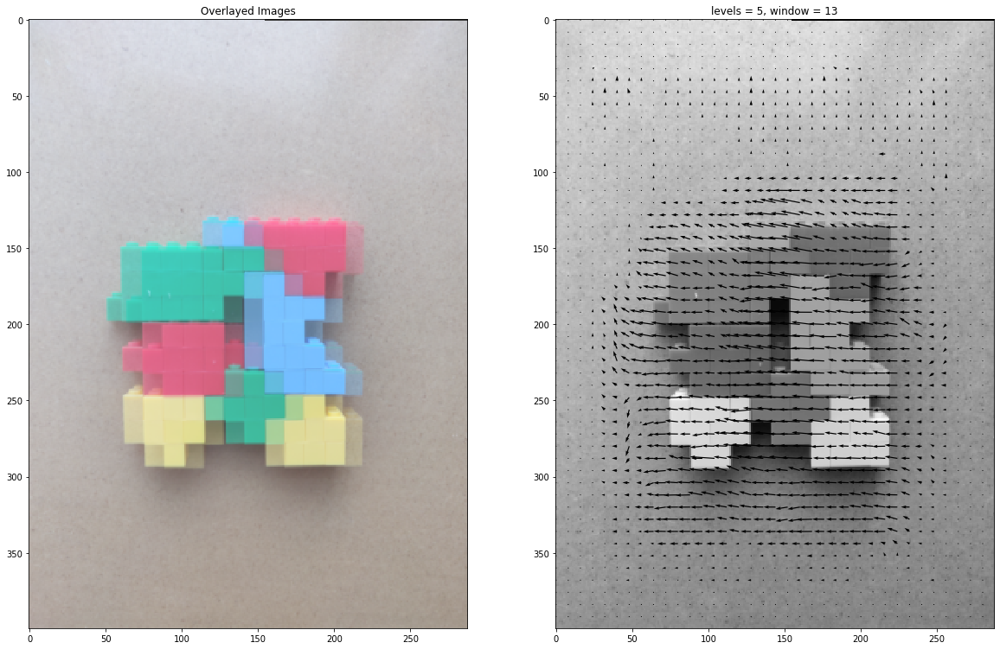

In [23]:
# Example code to generate output
window=13
numLevels=1
U,V=LucasKanadeMultiScale(grayscale(images[0]),grayscale(images[1]),\
                          window,numLevels)
plot_optical_flow(images[0],images[1],U,-V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window))

numLevels=3
# Plot
U,V=LucasKanadeMultiScale(grayscale(images[0]),grayscale(images[1]),\
                          window,numLevels)
plot_optical_flow(images[0],images[1],U,-V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window))

numLevels=5
# Plot
U,V=LucasKanadeMultiScale(grayscale(images[0]),grayscale(images[1]),\
                          window,numLevels)
plot_optical_flow(images[0],images[1],U,-V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window))



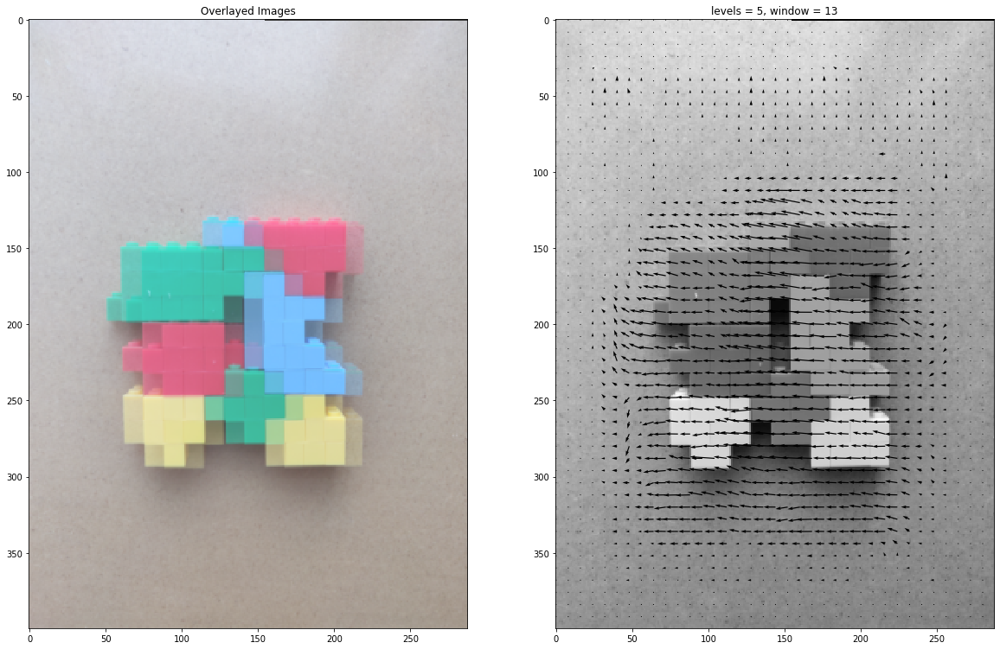

In [21]:
window=13
numLevels=5
# Plot
U,V=LucasKanadeMultiScale(grayscale(images[0]),grayscale(images[1]),\
                          window,numLevels)
plot_optical_flow(images[0],images[1],U,-V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window))

#### Your Comments on the results of Part 2:

As the number of levels increases, the optical flow outputted becomes better. By better it is meant that there is less extraneous noise in the form of abnormally long arrows, as well as each of the arrows agree with the other arrows around it, showing a consistent optical flow is plausible for the object to have undergone. At numLevels =1 the image is almost useless as far as determining the optical flow of the object. At numLevels =3, there is still noise but a human can logically pick out and ignore the noise and thus get a good idea of the true optical flow. At numLevels =5, almost all the noise is gone and the arrows agree with each other, demonstrating a consistent optical flow of the object in the image.
This optical flow agrees with the movement that would be inferred by looking at pictures 1 and 2.
The reason for the improvement in optical flow as the number of levels increases is because at higher levels, the optical flow is found first for a very coarse image (the higher the level the coarser the image), and then refined with finer and finer images with each level, giving the consistent result seen in numLevels =5, as opposed to the noisey result seen in numLevels =3.

### Part 3: Window size [3 pts]

Plot optical flow for the pair of images im1 and im2 for at least 3 different window sizes which leads to observable difference in the results. Comment on the effect of window size on results and justify. For this part fix the number of levels to be 3 for multi-scale Lucas-Kanade.

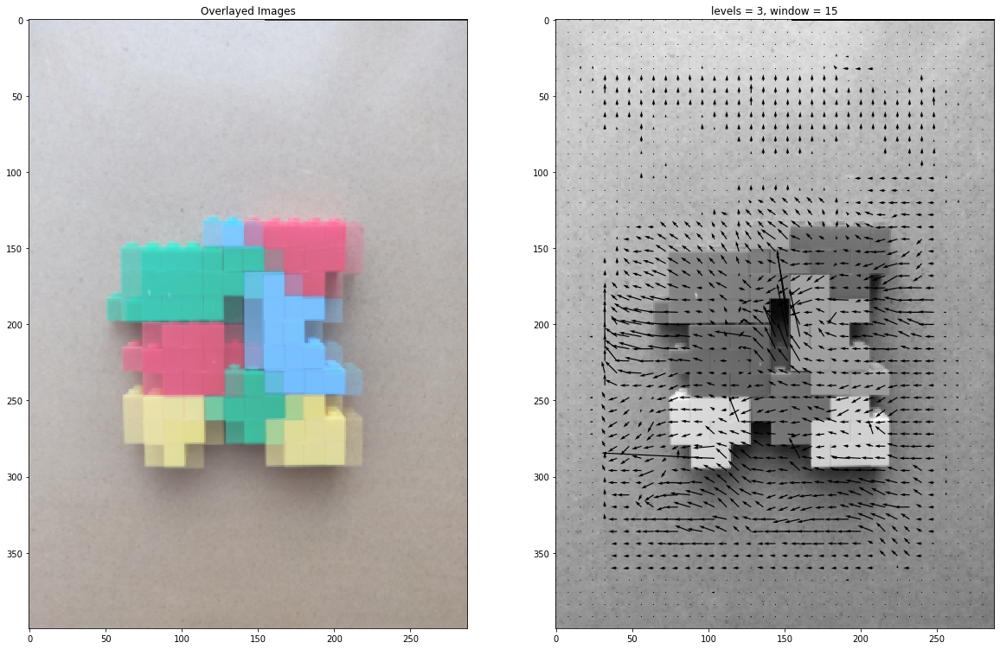

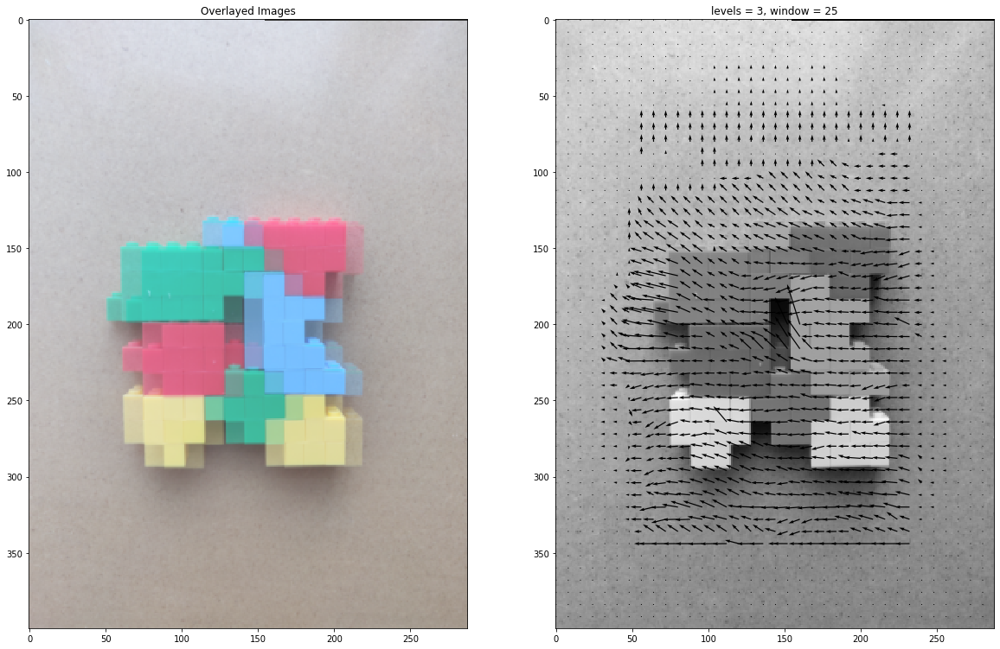

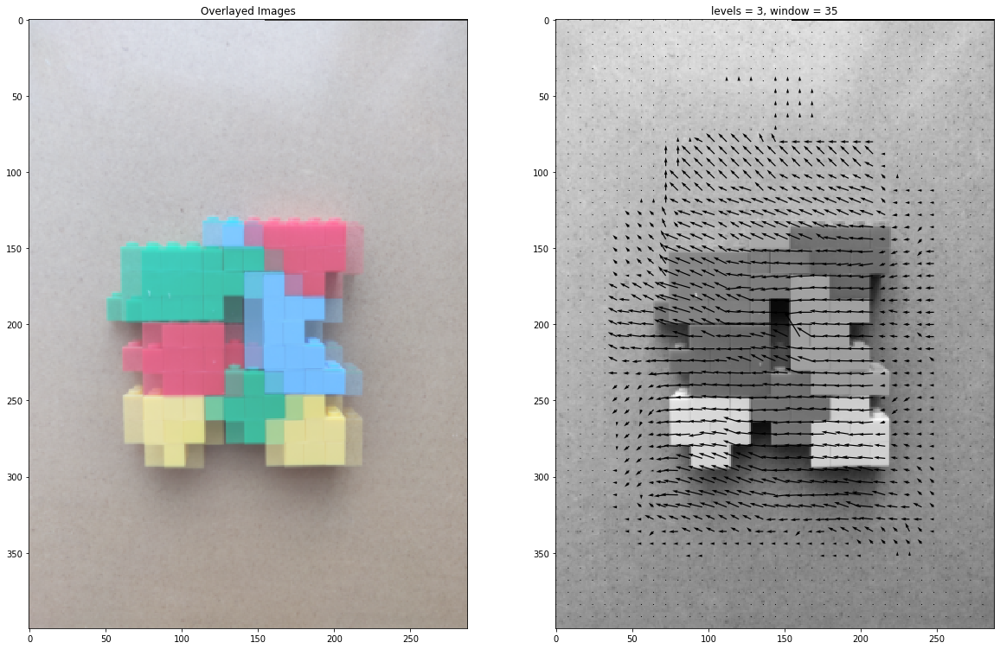

In [238]:
# Example code, change as required
numLevels=3

w1, w2, w3 = 15, 25, 35
for window in [w1, w2, w3]:
    U,V=LucasKanadeMultiScale(grayscale(images[0]),grayscale(images[1]),\
                              window,numLevels)
    plot_optical_flow(images[0],images[1], U,-V, \
                      'levels = ' + str(numLevels) + ', window = '+str(window))

#### Your Comments on the results of Part 3:
For Part 3, numLevels is fixed at 3, giving decent results, and the window size is varied. The smallest window size, 15, gives the result with the highest noise and least consistent flow, window size 25 is in the middle as far as noise and flow consistentcy goes, and window size of 35 gives the lowest noise and highest consistency. This is expected of window size, as a larger window takes more of the pixels surrounding the pixel of interest into account, resulting in a sort of smoothing effect in the optical flow.

However, these are not the only determining factors of quality, as accuracy of the flow direction is important as well. The smallest window size has arrows that, though noisey, seem to point in the most exact angle. What is meant by this is that as window size is increased, the arrow direction appears to be more and more discretized, with window size of 35 having most of its arrows seem to point in angles in increments of 45 degrees. This results in a smoother flow but may be potentially less accurate. This is expected for the reasons stated above: a larger window will result in a smoothed optical flow, while a smaller window will improve the details.

This reasoning makes sense, as the algorithm makes the assumption that all pixels a given window have the same velocity, so clearly a larger window will force more of them to have that same velocity, basically smoothing.
With this information, the window size can be chosen for the application; applications requiring a smooth flow can use a larger window size and applications requiring high detail in the flow can use a smaller window size.

### Part 4: Other pairs [3 pts]

Find optical flow for the pairs (im1,im2), (im1,im3), (im1,im4) using one good window size and number of levels. Does the optical flow result seem consistent with visual inspection? Comment on the type of motion indicated by results and visual inspection and explain why they might be consistent or inconsistent.

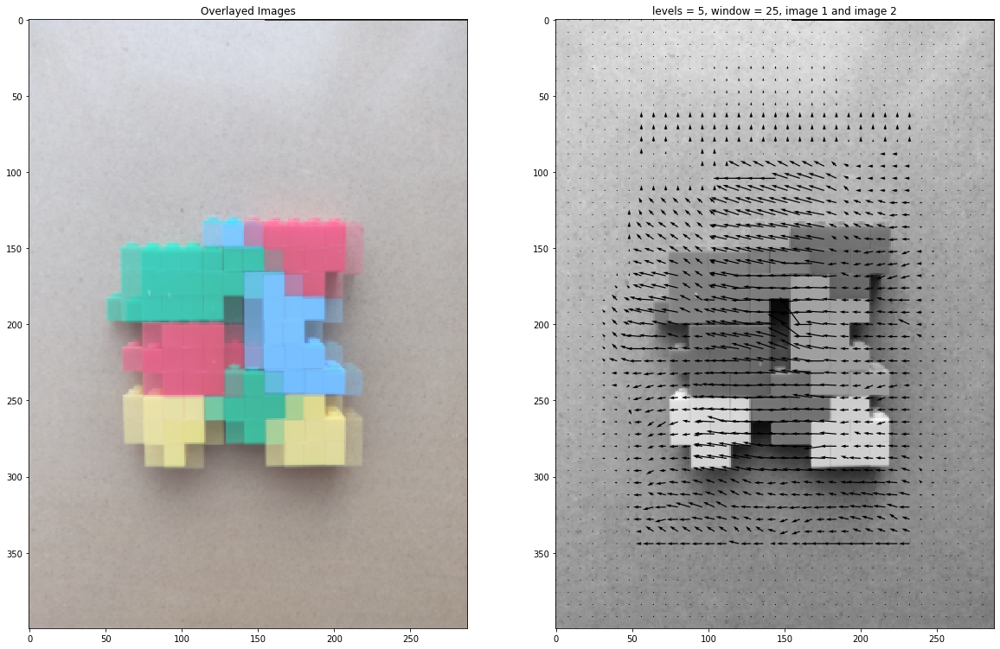

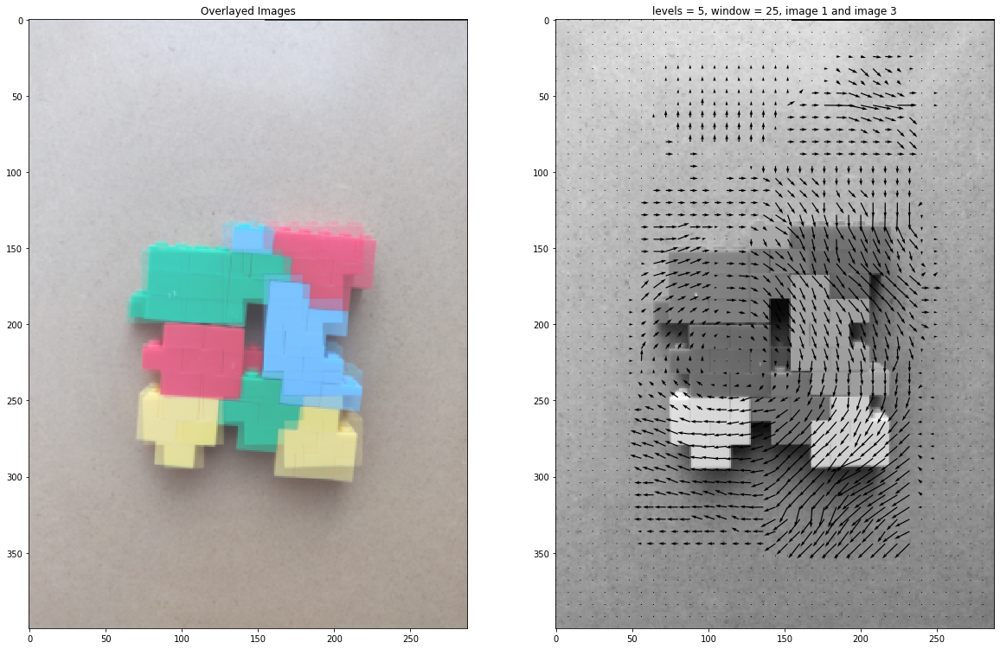

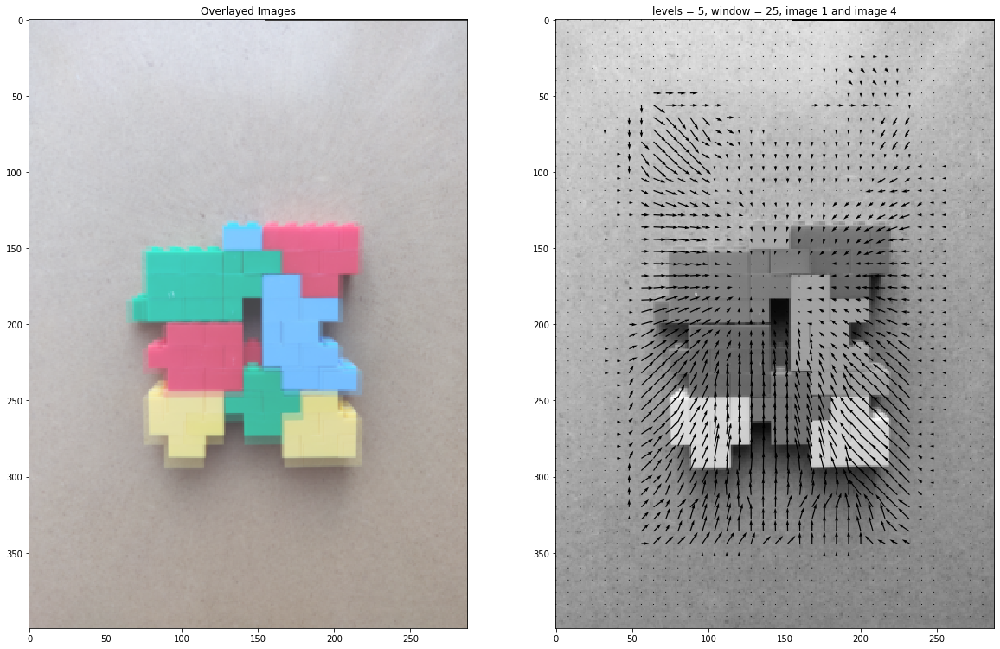

In [30]:
# Your code here
# use one fixed window and numLevels for all pairs
# Example code to generate output
window=25
numLevels=5
U,V=LucasKanadeMultiScale(grayscale(images[0]),grayscale(images[1]),\
                          window,numLevels)
plot_optical_flow(images[0],images[1],U,-V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window) + ', image 1 and image 2')


U,V=LucasKanadeMultiScale(grayscale(images[0]),grayscale(images[2]),\
                          window,numLevels)
plot_optical_flow(images[0],images[2],U,-V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window) + ', image 1 and image 3')


U,V=LucasKanadeMultiScale(grayscale(images[0]),grayscale(images[3]),\
                          window,numLevels)
plot_optical_flow(images[0],images[3],U,-V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window) + ', image 1 and image 4')

#### Your Comments on the results of Part 4:

For image 1 and image 2, the visual inspection indicates that the object moved to the left and up. The optical flow shows that the image did indeed move up and to the left with the arrows pointing in a consistent flow in the direction. So motion is consistent with optical flow results.

For image 1 and image 3, the object undergoes a small clockwise rotation. This is picked up in the optical flow, as all arrows on the object rotate clockwise as well. The center of rotation is clearly visible on the optical flow as well. The background also shows some clockwise rotation on the optical flow, likely the result of slight discoloring of the surface the object was sittting on. Overall this is good optical flow results.

For image 1 and image 4, the object is further away, likely zoomed out on. The optical flow shows this as the arrows point inwards towards the point on the image that stayed unchanged as the object was zoomed out on. This indicates good optical flow results.

## Problem 2: RGB Optical Flow[10 pts]

In this problem, we extend optical flow to RGB images. 

### Part 1: Derivation [5 pts]

In lecture, we used brightness constancy constraint and taylor series expansion to come up with the optical flow equation 
$$I_xu +I_yv+I_t = 0$$  and we derived the Lucas-Kanade least squares solution assuming same velocity over a patch as:

$$
\left(\begin{array}{cc} 
\sum I_x^2 & \sum I_xI_y\\
\sum I_xI_y & \sum I_y^2
\end{array}\right)
\left(\begin{array}{c} 
u \\ 
v 
\end{array}\right) = -
\left(\begin{array}{c} 
\sum I_xI_t\\ 
\sum I_yI_t
\end{array}\right)
$$ 

Derive similar equation for RGB images under a color constancy constraint by applying the brightness constancy constraint to each of the channels, and formulating a cost function over the thee channels.


#### Your derivation here:



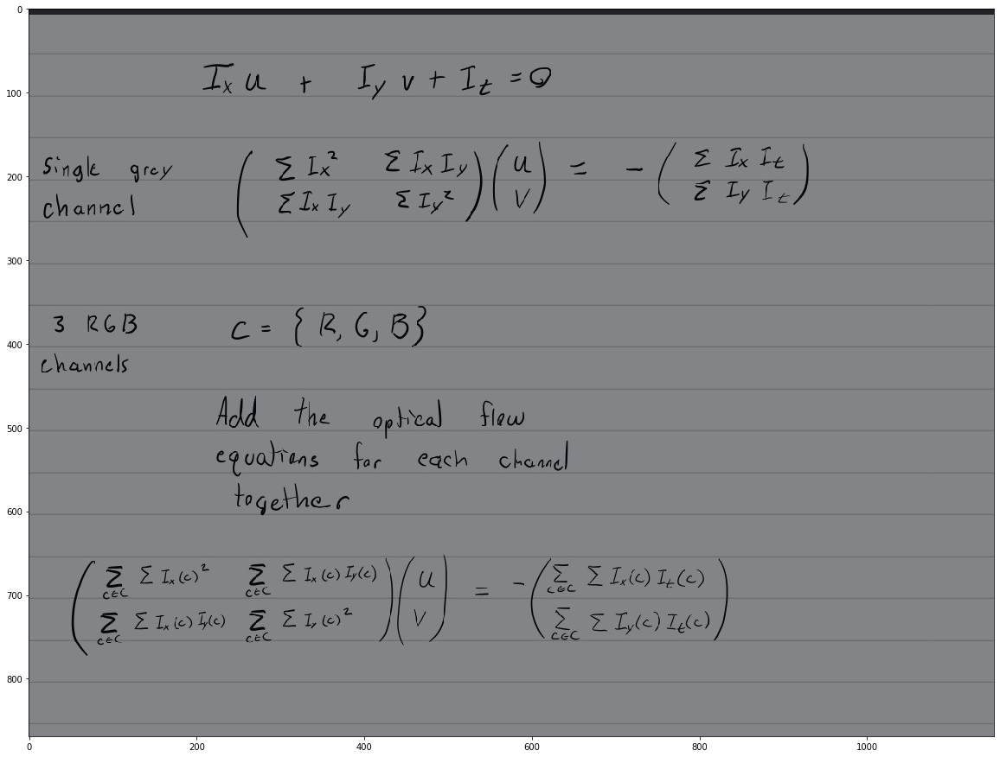

In [237]:
image = plt.imread('FullSizeRender.jpeg')
plt.figure(figsize=(20, 20))
plt.imshow(image) 
plt.show()

### Part 2: Computing Flow [4pts]

Complete the functions LucasKanadeMultiScaleRGB and OpticalFlowRefineRGB and run it for window size = 13 and number of levels = 3

**Note**: You can implement the single scale version without incurring any penalty.

In [52]:
def warp(im, u_prev, v_prev):
    warpedIm = np.zeros(im.shape)
    for i in range(0, im.shape[0]):
        for j in range(0,im.shape[1]):
            x = np.rint(i+v_prev[i,j]).astype(np.int)
            y = np.rint(j+u_prev[i,j]).astype(np.int)
            #x = np.rint(i+u_prev[i,j]).astype(int)
            #y = np.rint(j+v_prev[i,j]).astype(int)
            #if(x-i != 0): print('x: ', x-i, 'i,j = ', i,j)
            #if(y-j != 0): print('y: ', y-j, 'i,j = ', i,j)
            if (0<=x) and (x<im.shape[0]) and (0<=y) and (y<im.shape[1]):
                warpedIm[i,j] = im[x, y]
    return warpedIm

def It_patch(im2, im1, u_prev, v_prev, i, j, sub, add): 
    #lower and upper bounds
    #i and j are the placed it is cetnered on
    #shift entire patch by the u_prev and v_prev
    u_window = np.rint(u_prev[i,j]).astype(np.int)
    v_window = np.rint(v_prev[i,j]).astype(np.int)
    #Dims = [i-sub+v_window, i+add+v_window, j-sub+u_window, j+add+u_window]
    patch1 = im1[i-sub:i+add, j-sub:j+add]
    patch2 = im2[i-sub+v_window:i+add+v_window,
                 j-sub+u_window:j+add+u_window]
    It_patch = patch2 - patch1
    return It_patch

def Ix2(im, dim):
    gX, gY = gradient(im)
    result = gX*gX
    #each location in matrix has to be the summation over the entire window
    #convolve window at each location
    return gX, convolve2d(result, np.ones((dim,dim)), mode='same')
def Iy2(im, dim):
    gX, gY = gradient(im)
    result = gY*gY
    return gY, convolve2d(result, np.ones((dim,dim)), mode='same')
def IxIy(im, dim):
    gX, gY = gradient(im)
    result = gX*gY
    return convolve2d(result, np.ones((dim,dim)), mode='same')
    
def OpticalFlowRefine_RGB(im1,im2,window, u_prev=None, v_prev=None):
    '''
    Inputs: the two images at current level and window size
    u_prev, v_prev - previous levels optical flow
    Return u,v - optical flow at current level
    '''
    im1_0, im2_0 = im1[:,:,0], im2[:,:,0]
    im1_1, im2_1 = im1[:,:,1], im2[:,:,1]
    im1_2, im2_2 = im1[:,:,2], im2[:,:,2]
    ############################# get u_prev and v_prev
    u, v = np.zeros(im1_0.shape), np.zeros(im1_0.shape)
    if u_prev is None and v_prev is None:
        u_prev, v_prev = np.zeros(im1_0.shape), np.zeros(im1_0.shape)
    u_prev = np.round(u_prev).astype(np.int)
    v_prev = np.round(v_prev).astype(np.int)
    
    ############################# get matrices of Ix^2, Iy^2, IxIy     
    Ix_0, Ix2Master_0 = Ix2(im1_0, window)
    Iy_0, Iy2Master_0 = Iy2(im1_0, window)
    IxIyMaster_0 = IxIy(im1_0, window)
    
    Ix_1, Ix2Master_1 = Ix2(im1_1, window)
    Iy_1, Iy2Master_1 = Iy2(im1_1, window)
    IxIyMaster_1 = IxIy(im1_1, window)
    
    Ix_2, Ix2Master_2 = Ix2(im1_2, window)
    Iy_2, Iy2Master_2 = Iy2(im1_2, window)
    IxIyMaster_2 = IxIy(im1_2, window)
    
    sub = window//2
    add = window//2
    sz = im1.shape
    for i in range(sub, sz[0]-add-1 ):
        for j in range(sub, sz[1]-add-1):
            c = np.zeros((2,2))
            d = np.zeros((2,2))
            oM = np.zeros((2,1))
            #if window%2 == 0:
            #    #wT - np.array(It[i-sub:i+add, j-sub:j+add])
            #    wX = np.array(Ix[i-sub:i+add, j-sub:j+add])
            #    wY = np.array(Iy[i-sub:i+add, j-sub:j+add])
            #    wT = It_patch(im2, im1, u_prev, v_prev, i, j, sub, add)    
            #else:
                #wT = np.array(It[i-sub:i+add+1, j-sub:j+add+1])
            wX_0 = np.array(Ix_0[i-sub:i+add, j-sub:j+add])
            wY_0 = np.array(Iy_0[i-sub:i+add, j-sub:j+add])
            wT_0 = It_patch(im2_0, im1_0, u_prev, v_prev, i, j, sub, add)
            
            wX_1 = np.array(Ix_1[i-sub:i+add, j-sub:j+add])
            wY_1 = np.array(Iy_1[i-sub:i+add, j-sub:j+add])
            wT_1 = It_patch(im2_1, im1_1, u_prev, v_prev, i, j, sub, add)
            
            wX_2 = np.array(Ix_2[i-sub:i+add, j-sub:j+add])
            wY_2 = np.array(Iy_2[i-sub:i+add, j-sub:j+add])
            wT_2 = It_patch(im2_2, im1_2, u_prev, v_prev, i, j, sub, add)
            
            c[0,0] = Ix2Master_0[i,j] + Ix2Master_1[i,j] + Ix2Master_2[i,j]
            c[0,1] = IxIyMaster_0[i,j] + IxIyMaster_1[i,j] + IxIyMaster_2[i,j]
            c[1,0] = IxIyMaster_0[i,j] + IxIyMaster_1[i,j] + IxIyMaster_2[i,j]
            c[1,1] = Iy2Master_0[i,j] + Iy2Master_1[i,j] + Iy2Master_2[i,j]
            
            #now to find the second matrix
            oM[0,0] = np.sum(-wX_0*wT_0) + np.sum(-wX_1*wT_1) + np.sum(-wX_2*wT_2)
            oM[1,0] = np.sum(-wY_0*wT_0) + np.sum(-wY_1*wT_1) + np.sum(-wY_2*wT_2)
            #print(oM[0,0], oM[1,0])
            uv = np.matmul(np.linalg.pinv(c), oM) ##PROMBLE, C IS SINGULAR
            u[i,j] = uv[0]
            v[i,j] = uv[1]
            nothing =0
    u = u + u_prev
    v = v + v_prev
    return u, v



In [57]:
def gaussian2d(filter_size=5, sig=1.0):
    """Creates a 2D Gaussian kernel with
    side length `filter_size` and a sigma of `sig`."""
    ax = np.arange(-filter_size // 2 + 1., filter_size // 2 + 1.)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-0.5 * (np.square(xx) + np.square(yy)) / np.square(sig))
    return kernel / np.sum(kernel)

def downSampleImRGB(im1, im2, level): #send it the level 1 through..5 (level 1 is fullsize)
    im1Down_0, im2Down_0 = im1[:,:,0], im2[:,:,0]
    im1Down_1, im2Down_1 = im1[:,:,1], im2[:,:,1]
    im1Down_2, im2Down_2 = im1[:,:,2], im2[:,:,2]
    if level == 1:
        im1DownF = im1
        im2DownF = im2
    
    for i in range(level-1):
        smooth1_0 = convolve2d(im1Down_0,gaussian2d(), mode='same')
        smooth2_0 = convolve2d(im2Down_0,gaussian2d(), mode='same')
        im1Down_0 = smooth1_0[::2,::2]
        im2Down_0 = smooth2_0[::2,::2]
        
        smooth1_1 = convolve2d(im1Down_1,gaussian2d(), mode='same')
        smooth2_1 = convolve2d(im2Down_1,gaussian2d(), mode='same')
        im1Down_1 = smooth1_1[::2,::2]
        im2Down_1 = smooth2_1[::2,::2]
        
        smooth1_2 = convolve2d(im1Down_2,gaussian2d(), mode='same')
        smooth2_2 = convolve2d(im2Down_2,gaussian2d(), mode='same')
        im1Down_2 = smooth1_2[::2,::2]
        im2Down_2 = smooth2_2[::2,::2]
        
        im1DownF = np.zeros((im1Down_0.shape[0], im1Down_0.shape[1], 3))
        im2DownF = np.zeros((im2Down_0.shape[0], im2Down_0.shape[1], 3))
        im1DownF[:,:,0] = im1Down_0
        im2DownF[:,:,0] = im2Down_0
        im1DownF[:,:,1] = im1Down_1
        im2DownF[:,:,1] = im2Down_1
        im1DownF[:,:,2] = im1Down_2
        im2DownF[:,:,2] = im2Down_2
    return im1DownF, im2DownF

def LucasKanadeMultiScaleRGB(im1,im2,window, numLevels=2):
    '''
    Implement the multi-resolution Lucas kanade algorithm
    Inputs: the two images, window size and number of levels
    if numLevels = 1, then compute optical flow at only the given image level.
    Returns: u, v - the optical flow
    '''
    
    """ ==========
    YOUR CODE HERE
    ========== """
    # You can call OpticalFlowRefine iteratively
    im1Down, im2Down = downSampleImRGB(im1, im2, numLevels)
    u, v = OpticalFlowRefine_RGB(im1Down, im2Down, window)
    #u_prev, v_prev = u, v
    for lvl in range(numLevels -1): #starts at 0, goes through running on numLevels-2
        #u_prev, v_prev = u, v
        u_prev, v_prev = upsample_flow(u, v)
        im1Down, im2Down = downSampleImRGB(im1, im2, numLevels-lvl-1)
        u, v = OpticalFlowRefine_RGB(im1Down, im2Down, window, u_prev, v_prev)
        #u, v = u_prev+u_new, v_prev+v_new
    return u, v

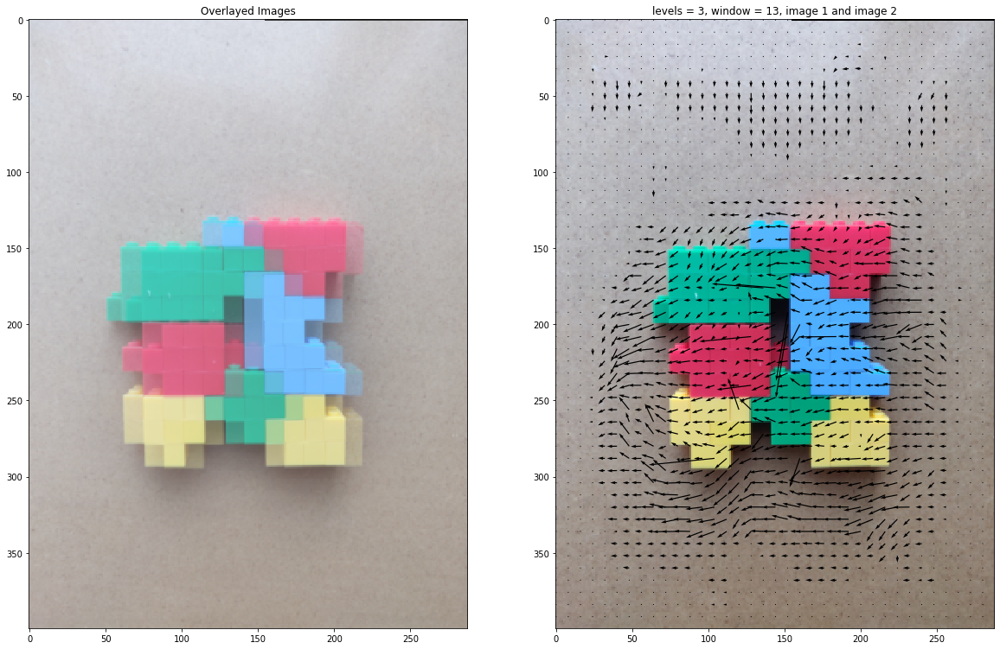

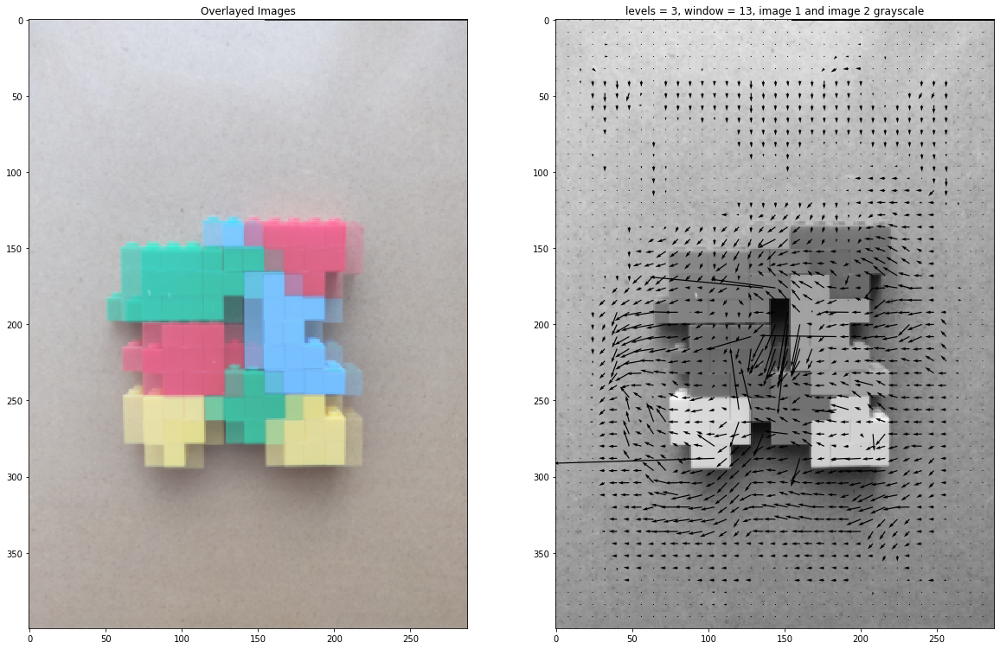

In [58]:
# Your code here
# use one fixed window and numLevels for all pairs
# Example code to generate output
window=13
numLevels=3
U,V=LucasKanadeMultiScaleRGB(images[0][:,:,:3],images[1][:,:,:3],\
                          window,numLevels)
plot_optical_flow(images[0],images[1],U,V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window) + ', image 1 and image 2', color=True)

U,V=LucasKanadeMultiScale(grayscale(images[0]),grayscale(images[1]),\
                          window,numLevels)
plot_optical_flow(images[0],images[1],U,V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window) + ', image 1 and image 2 grayscale')


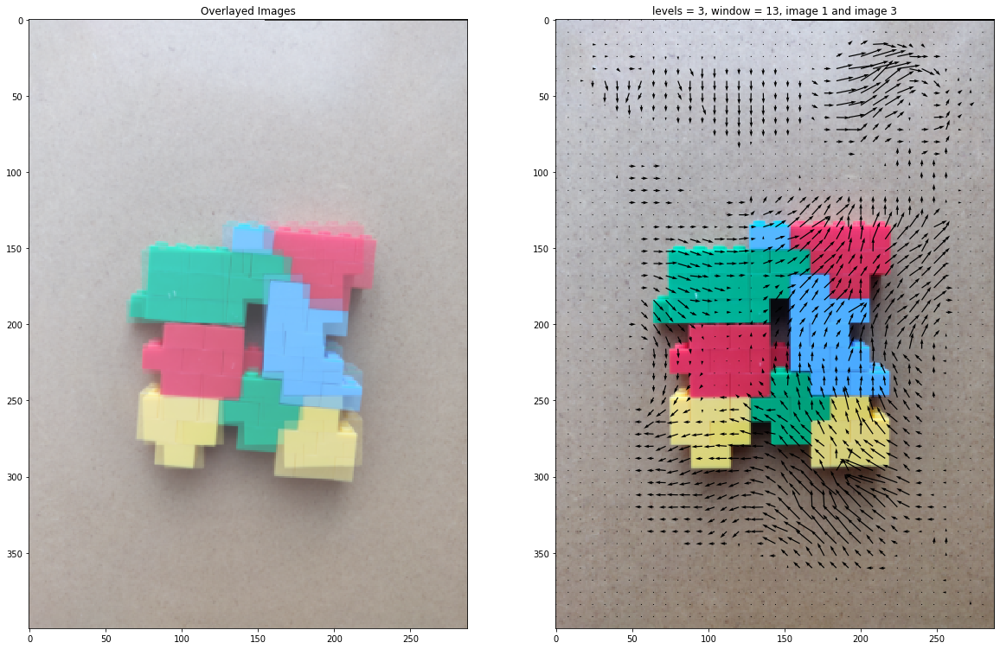

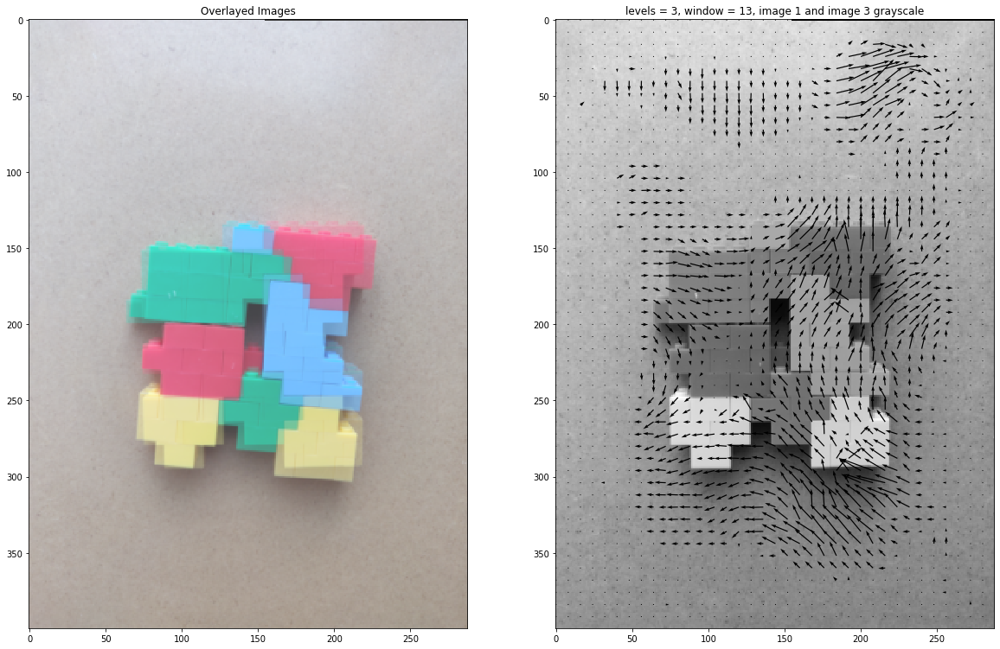

In [59]:
# Your code here
# use one fixed window and numLevels for all pairs
# Example code to generate output
window=13
numLevels=3

U,V=LucasKanadeMultiScaleRGB(images[0][:,:,:3],images[2][:,:,:3],\
                          window,numLevels)
plot_optical_flow(images[0],images[2],U,V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window) + ', image 1 and image 3', color=True)

U,V=LucasKanadeMultiScale(grayscale(images[0]),grayscale(images[2]),\
                          window,numLevels)
plot_optical_flow(images[0],images[2],U,V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window) + ', image 1 and image 3 grayscale')


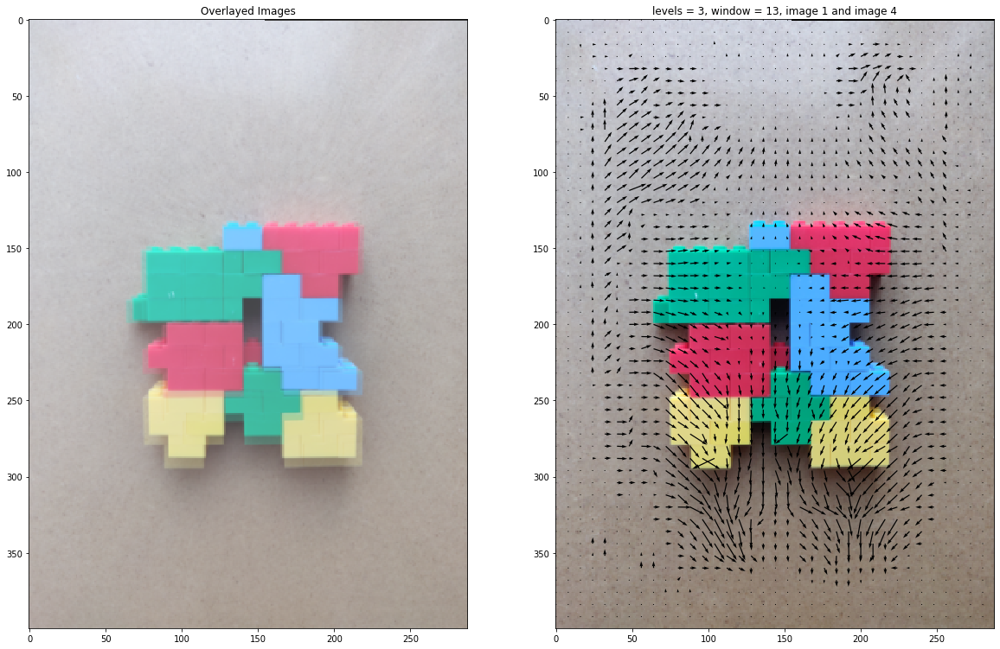

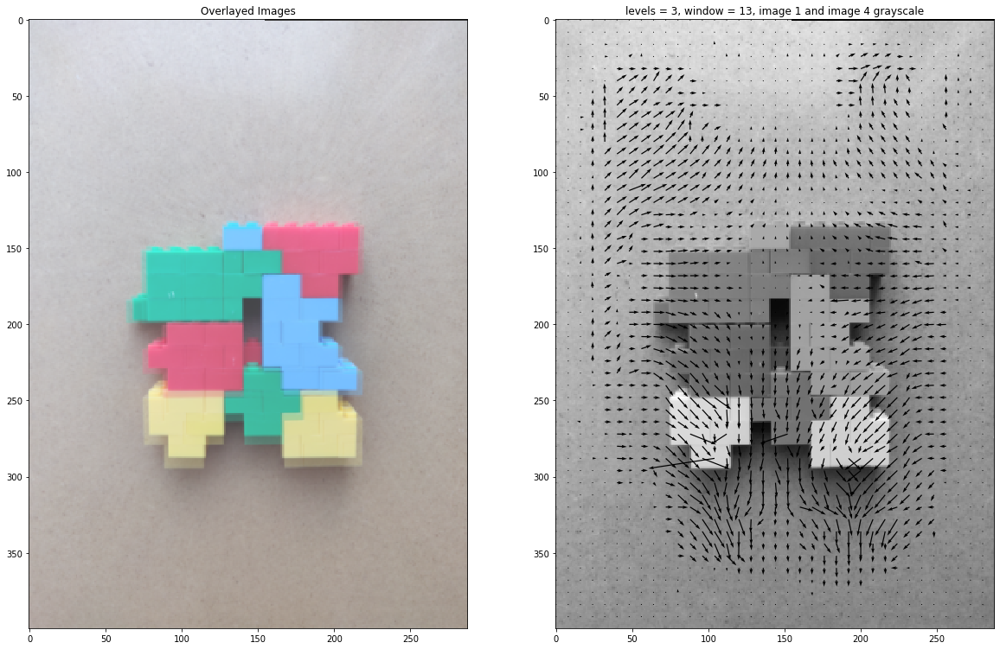

In [60]:
# Your code here
# use one fixed window and numLevels for all pairs
# Example code to generate output
window=13
numLevels=3

U,V=LucasKanadeMultiScaleRGB(images[0][:,:,:3],images[3][:,:,:3],\
                          window,numLevels)
plot_optical_flow(images[0],images[3],U,V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window) + ', image 1 and image 4', color=True)

U,V=LucasKanadeMultiScale(grayscale(images[0]),grayscale(images[3]),\
                          window,numLevels)
plot_optical_flow(images[0],images[3],U,V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window) + ', image 1 and image 4 grayscale')


### Part 3 (1pt):

Comment on differences in outputs of the RGB optical flow with the grayscale version

As only 3 levels were used, the results of optical flow are not as good as they'd be with 5 levels. 
Across all 3 sets of images, the RGB optical flow performs better. There is less noise in the form of long arrows pointing in the wrong direction on RGB than there is seen on the grayscale version. This implies more consistency pixel to pixel in the optical flow determined, which is likely the result of having more information in the form of 3 color channels as opposed to 1.
RGB, though an improvement, was not a big imporvement considering the added runtime. The greyscale version of the algorithm performs better than the RGB version when given more levels than the RGB version. It also performs faster, owing to the fact that it has more levels, but only 1 channel instead of 3. 
Therefore the RGB solution does not give the best results in terms of the quality - runtime trade off. This is likely to do with the fact that though RGB has 3 channels, the channels are high correlated with each other, limiting the amount of new information that can be used in optical flow.

## Problem 3: Machine Learning [12 pts]

In this problem, you will implement several machine learning solutions for computer vision problems.

### Part 1: Initial setup [1 pts]

Follow the directions on https://pytorch.org/get-started/locally/ to install Pytorch on your computer. 

Note: You will not need GPU support for this assignment so don't worry if you don't have one. Furthermore, installing with GPU support is often more difficult to configure so it is suggested that you install the CPU only version. TA's will not provide any support related to GPU or CUDA.

Run the torch import statements below to verify your instalation.

Download the MNIST data from http://yann.lecun.com/exdb/mnist/.

Download the 4 zipped files, extract them into one folder, and change the variable 'path' in the code below. (Code taken from https://gist.github.com/akesling/5358964 )

Plot one random example image corresponding to each label from training data.

In [241]:
import torch.nn as nn
import torch.nn.functional as F
import torch
from torch.autograd import Variable

x = torch.rand(5, 5)
print(x)

tensor([[0.5263, 0.1655, 0.1756, 0.1805, 0.8097],
        [0.7850, 0.8231, 0.5782, 0.9966, 0.4442],
        [0.3103, 0.4593, 0.2455, 0.0620, 0.7717],
        [0.4953, 0.0928, 0.9551, 0.6391, 0.4973],
        [0.7272, 0.8829, 0.1891, 0.7255, 0.9531]])


In [242]:
import os
BASE_DIR = os.path.abspath('MNIST')
print(BASE_DIR)

/Users/femw90/Google Drive/SECKSY (1)/Grad School/Fall Quarter 2020/CSE 252A/Homeworks/Homework 4/hw4/MNIST


In [243]:
import os
import struct

# Change path as required
path = "./mnist/"

def read(dataset = "training", datatype='images'):
    """
    Python function for importing the MNIST data set.  It returns an iterator
    of 2-tuples with the first element being the label and the second element
    being a numpy.uint8 2D array of pixel data for the given image.
    """

    if dataset is "training":
        fname_img = os.path.join(path, 'train-images.idx3-ubyte')
        fname_lbl = os.path.join(path, 'train-labels.idx1-ubyte')
    elif dataset is "testing":
        fname_img = os.path.join(path, 't10k-images.idx3-ubyte')
        fname_lbl = os.path.join(path, 't10k-labels.idx1-ubyte')

    # Load everything in some numpy arrays
    with open(fname_lbl, 'rb') as flbl:
        magic, num = struct.unpack(">II", flbl.read(8))
        lbl = np.fromfile(flbl, dtype=np.int8)

    with open(fname_img, 'rb') as fimg:
        magic, num, rows, cols = struct.unpack(">IIII", fimg.read(16))
        img = np.fromfile(fimg, dtype=np.uint8).reshape(len(lbl), rows, cols)
    
    if(datatype=='images'):
        get_data = lambda idx: img[idx]
    elif(datatype=='labels'):
        get_data = lambda idx: lbl[idx]

    # Create an iterator which returns each image in turn
    for i in range(len(lbl)):
        yield get_data(i)
        
trainData=np.array(list(read('training','images')))
trainLabels=np.array(list(read('training','labels')))
testData=np.array(list(read('testing','images')))
testLabels=np.array(list(read('testing','labels')))

In [244]:
# Understand the shapes of the each variable carying data
print(trainData.shape, trainLabels.shape)
print(testData.shape, testLabels.shape)

(60000, 28, 28) (60000,)
(10000, 28, 28) (10000,)


Image with label:  5


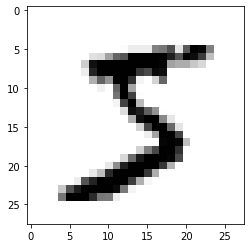

Image with label:  0


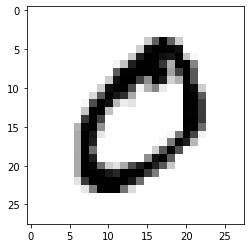

Image with label:  4


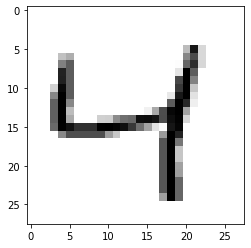

Image with label:  1


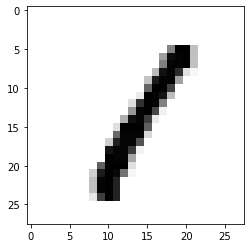

Image with label:  9


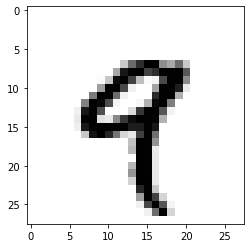

Image with label:  2


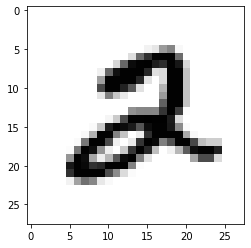

Image with label:  3


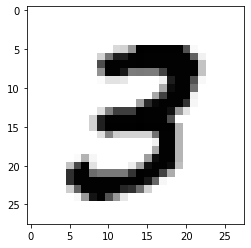

Image with label:  6


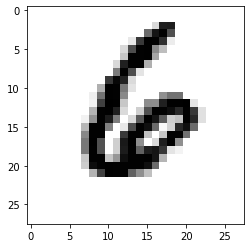

Image with label:  7


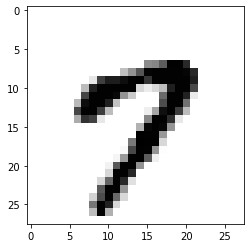

Image with label:  8


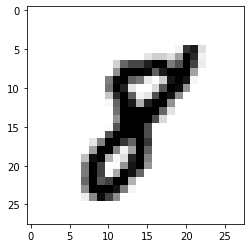

All labels displayed.


In [93]:
# display one image from each label
""" ==========
YOUR CODE HERE
========== """
displayed_already = []
sz = trainData.shape
for i in range(0, sz[0]):
    label = trainLabels[i]
    if label not in displayed_already:
        print('Image with label: ', label)
        plt.imshow(trainData[i, :, :], cmap = 'binary')
        plt.show()
        displayed_already.append(label)
    numShown = len(displayed_already)
    if numShown >= 10: 
        print('All labels displayed.')
        break

Some helper functions are given below.

In [155]:
# a generator for batches of data
# yields data (batchsize, 28, 28) and labels (batchsize)
# if shuffle, it will load batches in a random order
from tqdm import tqdm
def DataBatch(data, label, batchsize, shuffle=True):
    n = data.shape[0]
    if shuffle:
        index = np.random.permutation(n)
    else:
        index = np.arange(n)
    for i in range(int(np.ceil(n/batchsize))):
        inds = index[i*batchsize : min(n,(i+1)*batchsize)]
        yield data[inds], label[inds]

# tests the accuracy of a classifier
def test(testData, testLabels, classifier):
    batchsize=50
    correct=0.
    for data,label in tqdm(DataBatch(testData,testLabels,batchsize,shuffle=False)):
        prediction = classifier(data)
        correct += np.sum(prediction==label)
        
    return correct/testData.shape[0]*100

# a sample classifier
# given an input it outputs a random class
class RandomClassifier():
    def __init__(self, classes=10):
        self.classes=classes
    def __call__(self, x):
        return np.random.randint(self.classes, size=x.shape[0])

randomClassifier = RandomClassifier()
print('Random classifier accuracy: %f' % 
      test(testData, testLabels, randomClassifier))

200it [00:00, 12322.60it/s]

Random classifier accuracy: 10.220000


### Part 2: Confusion Matrix [2 pts]
Here you will implement a function that computes the confusion matrix for a classifier.
The matrix (M) should be nxn where n is the number of classes.
Entry M[i,j] should contain the fraction of images of class i that was classified as class j.
Can you justify the accuracy given by the random classifier?

200it [00:00, 389.45it/s]


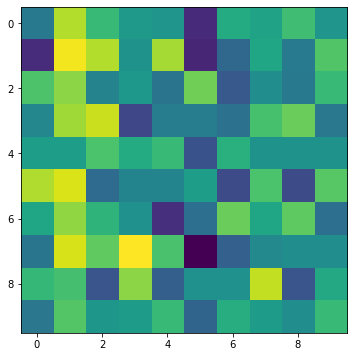

[[0.09 0.12 0.11 0.1  0.1  0.08 0.1  0.1  0.11 0.1 ]
 [0.08 0.12 0.12 0.1  0.12 0.08 0.09 0.1  0.09 0.11]
 [0.11 0.11 0.09 0.1  0.09 0.11 0.09 0.1  0.09 0.11]
 [0.1  0.12 0.12 0.08 0.09 0.09 0.09 0.11 0.11 0.09]
 [0.1  0.1  0.11 0.1  0.11 0.08 0.1  0.1  0.1  0.1 ]
 [0.12 0.12 0.09 0.09 0.09 0.1  0.08 0.11 0.08 0.11]
 [0.1  0.11 0.1  0.1  0.08 0.09 0.11 0.1  0.11 0.09]
 [0.09 0.12 0.11 0.12 0.11 0.07 0.09 0.1  0.1  0.1 ]
 [0.11 0.11 0.09 0.11 0.09 0.1  0.1  0.12 0.09 0.1 ]
 [0.09 0.11 0.1  0.1  0.11 0.09 0.1  0.1  0.1  0.11]]

 Accuracy:  0.09954659084972313


In [122]:
# Using the tqdm module to visualize run time is suggested
from tqdm import tqdm

# It would be a good idea to return the accuracy, along with the confusion 
# matrix, since both can be calculated in one iteration over test data, to 
# save time
def Confusion(testData, testLabels, classifier):
    M=np.zeros((10,10))
    acc=0.0
    """ ==========
    YOUR CODE HERE
    ========== """
    classes = [i for i in range(0,10)]
    numClasses, batchsize = len(classes), 50 #from test above
    confMat = np.zeros((numClasses, numClasses))
    
    for data, label in tqdm(DataBatch(testData, testLabels, batchsize)):
        pred = classifier(data)
        for i in range(batchsize):
            predInd = np.where(classes == pred[i])
            actInd = np.where(classes == label[i])
            confMat[predInd, actInd] += 1
    '''
    pred = classifier(testData)
    for i in range(len(pred)):
        predInd = np.where(classes == pred[i])
        actInd = np.where(classes == testLabels[i])
        confMat[predInd, actInd] += 1
    
    '''
    for i in range(0, numClasses):
        confMat[i] = confMat[i]/np.sum(confMat[i])
    
    acc =np.trace(confMat)/numClasses
    M = confMat
    return M, acc

def VisualizeConfusion(M):
    plt.figure(figsize=(14, 6))
    plt.imshow(M)
    plt.show()
    print(np.round(M,2))

M_ran,acc_ran = Confusion(testData, testLabels, randomClassifier)
VisualizeConfusion(M_ran)
print('\n Accuracy: ', acc_ran)

#### Your Comments on the accuracy & confusion matrix of random classifier:
The accuracy of the random classifier is shown above to be 9.9% for one run. Over many runs it averages about 10% accuracy. This makes perfect sense, as there are 10 classes, and the classifier is random, so there is a 1 in 10 chance, or 10%, to pick the correct class for a given piece of data.
Looking at the confusion matrix, each row sums to 1, which makes sense because the row entries represent probabilities, and each cell is around 0.1, which again makes sense because it is a random classifier, so each of the cells have a 10% chance of being chosen as the label by the classifier.

### Part 3: K-Nearest Neighbors (KNN) [4 pts]

* Here you will implement a simple knn classifier. The distance metric is Euclidean in pixel space. k refers to the number of neighbors involved in voting on the class, and should be 3. You are allowed to use sklearn.neighbors.KNeighborsClassifier.
* Display confusion matrix and accuracy for your KNN classifier trained on the entire train set. (should be ~97 %)
* After evaluating the classifier on the testset, based on the confusion matrix, mention the number that the number '2' is most often predicted to be, other than '2'.

In [245]:
from sklearn.neighbors import KNeighborsClassifier
class KNNClassifer():
    def __init__(self, k=3):
        # k is the number of neighbors involved in voting
        """ ==========
        YOUR CODE HERE
        ========== """
        self.classifier = KNeighborsClassifier(n_neighbors=k) 
        
    def train(self, trainData, trainLabels):
        """ ==========
        YOUR CODE HERE
        ========== """
        #trains with [n_samples, n_features]
        #flatten data
        sz = trainData.shape
        flatData = trainData.reshape(sz[0], sz[1]*sz[2])
        self.classifier.fit(flatData, trainLabels)
        
        
    def __call__(self, x):
        # this method should take a batch of images
        # and return a batch of predictions
        """ ==========
        YOUR CODE HERE
        ========== """
        sz = x.shape
        flatData = x.reshape(sz[0], sz[1]*sz[2])
        pred = self.classifier.predict(flatData)
        return pred


# test your classifier with only the first 100 training examples (use this
# while debugging)
# note you should get ~ 65 % accuracy
knnClassiferX = KNNClassifer()
knnClassiferX.train(trainData[:100], trainLabels[:100])
print ('KNN classifier accuracy: %f'%test(testData, testLabels, knnClassiferX))


0it [00:00, ?it/s]
11it [00:00, 108.90it/s]
23it [00:00, 111.48it/s]
35it [00:00, 112.33it/s]
47it [00:00, 112.65it/s]
59it [00:00, 111.92it/s]
71it [00:00, 113.83it/s]
83it [00:00, 115.10it/s]
95it [00:00, 114.74it/s]
107it [00:00, 113.61it/s]
119it [00:01, 112.57it/s]
131it [00:01, 111.66it/s]
142it [00:01, 110.25it/s]
153it [00:01, 109.34it/s]
164it [00:01, 108.79it/s]
175it [00:01, 107.91it/s]
186it [00:01, 107.08it/s]
200it [00:01, 110.07it/s]

KNN classifier accuracy: 64.760000


In [246]:
# test your classifier with all the training examples (This may take a while)
knnClassifer = KNNClassifer()
knnClassifer.train(trainData, trainLabels)
print('done')

done



0it [00:00, ?it/s]
1it [00:03,  3.84s/it]
2it [00:07,  3.76s/it]
3it [00:10,  3.61s/it]
4it [00:14,  3.55s/it]
5it [00:17,  3.46s/it]
6it [00:20,  3.35s/it]
7it [00:23,  3.26s/it]
8it [00:26,  3.22s/it]
9it [00:29,  3.17s/it]
10it [00:32,  3.17s/it]
11it [00:35,  3.15s/it]
12it [00:39,  3.13s/it]
13it [00:42,  3.12s/it]
14it [00:45,  3.10s/it]
15it [00:48,  3.17s/it]
16it [00:51,  3.15s/it]
17it [00:54,  3.13s/it]
18it [00:57,  3.11s/it]
19it [01:01,  3.16s/it]
20it [01:04,  3.17s/it]
21it [01:07,  3.15s/it]
22it [01:10,  3.15s/it]
23it [01:13,  3.14s/it]
24it [01:16,  3.15s/it]
25it [01:19,  3.13s/it]
26it [01:23,  3.14s/it]
27it [01:26,  3.15s/it]
28it [01:29,  3.16s/it]
29it [01:32,  3.24s/it]
30it [01:35,  3.20s/it]
31it [01:38,  3.17s/it]
32it [01:42,  3.13s/it]
33it [01:45,  3.12s/it]
34it [01:48,  3.11s/it]
35it [01:51,  3.10s/it]
36it [01:54,  3.09s/it]
37it [01:57,  3.09s/it]
38it [02:00,  3.13s/it]
39it [02:03,  3.17s/it]
40it [02:07,  3.18s/it]
41it [02:10,  3.19s/it]
42it 

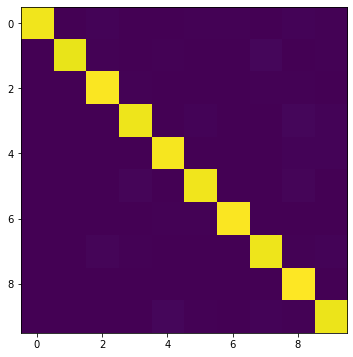

[[0.97 0.   0.01 0.   0.   0.01 0.   0.   0.01 0.  ]
 [0.   0.96 0.01 0.   0.01 0.   0.   0.02 0.   0.  ]
 [0.   0.   0.98 0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.96 0.   0.01 0.   0.   0.02 0.01]
 [0.   0.   0.   0.   0.98 0.   0.   0.   0.01 0.01]
 [0.   0.   0.   0.01 0.   0.97 0.   0.   0.01 0.  ]
 [0.   0.   0.   0.   0.   0.01 0.98 0.   0.   0.  ]
 [0.   0.   0.01 0.01 0.   0.   0.   0.96 0.   0.01]
 [0.   0.   0.   0.   0.   0.   0.   0.   0.99 0.  ]
 [0.   0.   0.   0.   0.02 0.   0.   0.01 0.   0.96]]

 Accuracy:  0.9709116052270813


In [248]:
# display confusion matrix for your KNN classifier with all the training examples
# (This may take a while)
""" ==========
YOUR CODE HERE
========== """
M_ran,acc_ran = Confusion(testData, testLabels, knnClassifer)
VisualizeConfusion(M_ran)
print('\n Accuracy: ', acc_ran)

#### Comments here on which number the number 2 is most often misclassified as
Here the accuracy is 97%, much better than random, and the confusion matrix reflects that as its diagonal entries, repesenting correct classifications, are all around 0.97.
Looking at the confusion matrix, the number 2 is most often predicted erroneously to be 1 or 7, likely because they resemble the shape of the 2. Note that it isnt necessarily visible in the confusion matrix since that matrix only goes to 2 significant values.

### Part 4: Principal Component Analysis (PCA) K-Nearest Neighbors (KNN) [5 pts]
Here you will implement a simple KNN classifer in PCA space (for k=3 and 25 principal components).
You should implement PCA yourself using svd (you may not use sklearn.decomposition.PCA
or any other package that directly implements PCA transformations

Is the testing time for PCA KNN classifier more or less than that for KNN classifier? Comment on why it differs if it does.

In [170]:
class PCAKNNClassifer():
    def __init__(self, components=25, k=3):
        # components = number of principal components
        # k is the number of neighbors involved in voting
        """ ==========
        YOUR CODE HERE
        ========== """
        self.classifier = KNeighborsClassifier(n_neighbors=k)
        self.comp, self.k =components, k
        
    def train(self, trainData, trainLabels):
        """ ==========
        YOUR CODE HERE
        ========== """
        sz = trainData.shape
        flatData = trainData.reshape(sz[0], sz[1]*sz[2])
        #print(np.transpose(flatData.shape))
        convariance = np.cov(np.transpose(flatData))
        #print(convariance.shape)
        # features in cols
        #s,u,v = np.linalg.svd(convariance, full_matrices = False)
        s,u,v = np.linalg.svd(convariance)
        #print(v.shape)
        W = np.transpose(v[:self.comp])
        newData = np.dot(flatData, W)
        self.classifier.fit(newData, trainLabels)
        self.W = W
        

        
        
    def __call__(self, x):
        # this method should take a batch of images
        # and return a batch of predictions        
        """ ==========
        YOUR CODE HERE
        ========== """
        sz = x.shape
        flatData = x.reshape(sz[0], sz[1]*sz[2])
        newData = np.dot(flatData, self.W)
        pred = self.classifier.predict(newData)
        return pred
        

    
# test your classifier with only the first 100 training examples (use this
# while debugging)
pcaknnClassiferX = PCAKNNClassifer()
pcaknnClassiferX.train(trainData[:100], trainLabels[:100])
print ('KNN classifier accuracy: %f'%test(testData, testLabels, pcaknnClassiferX))


0it [00:00, ?it/s]
25it [00:00, 241.85it/s]
48it [00:00, 238.01it/s]
70it [00:00, 232.21it/s]
93it [00:00, 230.75it/s]
118it [00:00, 234.75it/s]
143it [00:00, 236.22it/s]
167it [00:00, 236.02it/s]
200it [00:00, 230.17it/s]

KNN classifier accuracy: 66.160000



0it [00:00, ?it/s]
1it [00:00,  9.26it/s]
2it [00:00,  9.24it/s]
3it [00:00,  9.35it/s]
5it [00:00, 10.26it/s]
6it [00:00,  9.79it/s]
7it [00:00,  7.98it/s]
8it [00:00,  8.45it/s]
10it [00:01,  9.00it/s]
11it [00:01,  9.05it/s]
13it [00:01,  9.79it/s]
15it [00:01, 10.49it/s]
17it [00:01, 11.22it/s]
19it [00:01, 11.14it/s]
21it [00:01, 11.49it/s]
23it [00:02, 11.86it/s]
25it [00:02, 12.08it/s]
27it [00:02, 12.30it/s]
29it [00:02, 11.84it/s]
31it [00:02, 12.08it/s]
33it [00:02, 12.43it/s]
35it [00:03, 12.19it/s]
37it [00:03, 12.23it/s]
39it [00:03, 12.52it/s]
41it [00:03, 12.61it/s]
43it [00:03, 13.19it/s]
45it [00:03, 13.42it/s]
47it [00:04, 13.48it/s]
49it [00:04, 13.73it/s]
51it [00:04, 13.23it/s]
53it [00:04, 12.86it/s]
55it [00:04, 12.76it/s]
57it [00:04, 12.45it/s]
59it [00:04, 12.23it/s]
61it [00:05, 12.30it/s]
63it [00:05, 12.44it/s]
65it [00:05, 12.48it/s]
67it [00:05, 12.57it/s]
69it [00:05, 12.49it/s]
71it [00:05, 12.19it/s]
73it [00:06, 12.05it/s]
75it [00:06, 12.51it/s]
77i

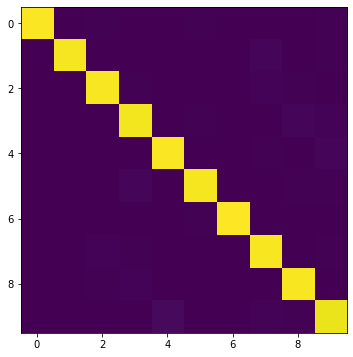

[[0.98 0.   0.01 0.   0.   0.01 0.   0.   0.   0.  ]
 [0.   0.97 0.   0.   0.   0.   0.   0.01 0.   0.01]
 [0.   0.   0.97 0.   0.   0.   0.   0.01 0.   0.  ]
 [0.   0.   0.   0.97 0.   0.01 0.   0.   0.02 0.01]
 [0.   0.   0.   0.   0.98 0.   0.   0.   0.   0.01]
 [0.   0.   0.   0.02 0.   0.97 0.   0.   0.01 0.  ]
 [0.   0.   0.   0.   0.   0.01 0.98 0.   0.   0.  ]
 [0.   0.   0.01 0.01 0.   0.   0.   0.97 0.   0.  ]
 [0.   0.   0.01 0.01 0.   0.   0.   0.   0.98 0.  ]
 [0.   0.   0.   0.   0.02 0.   0.   0.01 0.   0.96]]

 Accuracy:  0.9731690512703425


In [171]:
# test your classifier with all the training examples
pcaknnClassifer = PCAKNNClassifer()
pcaknnClassifer.train(trainData, trainLabels)
# display confusion matrix for your PCA KNN classifier with all the training examples
""" ==========
YOUR CODE HERE
========== """
M_ran,acc_ran = Confusion(testData, testLabels, pcaknnClassifer)
VisualizeConfusion(M_ran)
print('\n Accuracy: ', acc_ran)

#### Comments here on PCA vs PCA KNN testing time and the reasoning

PCA-KNN took 16 seconds to train, KNN took 11 minutes to train. (Though this may be partly due to my laptop's CPU facing thermal throttling due to its workload at training time. Never the less, KNN took significantly longer to train.)
Clearly, PCA-KNN is signficantly faster to train while stilla acheiving nearly the same accuracy, due to PCA reducing the dimensions but still keeping a large percentage of the information since PCA takes the principle components that have the largest significance.
This shows that PCA-KNN is an effective method to reduce training time.

## Problem 4: Deep learning [14 pts]
Below is some helper code to train your deep networks.

### Part 1:  Training with PyTorch [2 pts]
Below is some helper code to train your deep networks. 
Complete the train function for DNN below. You should write down the training operations in this function. That means, for a batch of data you have to initialize the gradients, forward propagate the data, compute error, do back propagation and finally update the parameters. This function will be used in the following questions with different networks.
You can look at https://pytorch.org/tutorials/beginner/pytorch_with_examples.html for reference.

In [172]:
# base class for your deep neural networks. It implements the training loop (train_net).
# You will need to implement the "__init__()" function to define the networks
# structures and "forward()", to propagate your data, in the following problems.

import torch.nn.init
import torch.optim as optim
from torch.autograd import Variable
from torch.nn.parameter import Parameter
from tqdm import tqdm
from scipy.stats import truncnorm

class DNN(nn.Module):
    def __init__(self):
        super(DNN, self).__init__()
        pass
    
    def forward(self, x):
        raise NotImplementedError
    
    def train_net(self, trainData, trainLabels, epochs=1, batchSize=50):
        criterion = nn.CrossEntropyLoss()
        optimizer = torch.optim.Adam(self.parameters(), lr = 3e-4)
        
        for epoch in range(epochs):
            self.train()  # set netowrk in training mode
            for i, (data,labels) in enumerate(DataBatch(trainData, trainLabels, batchSize, shuffle=True)):
                data = Variable(torch.FloatTensor(data))
                labels = Variable(torch.LongTensor(labels))
                optimizer.zero_grad()
                outputs = self.forward(data)
                loss = criterion(outputs,labels)
                loss.backward()
                optimizer.step()
                
                
            self.eval()  # set network in evaluation mode
            print ('Epoch:%d Accuracy: %f'%(epoch+1, test(testData, testLabels, self))) 
    
    def __call__(self, x):
        inputs = Variable(torch.FloatTensor(x))
        prediction = self.forward(inputs)
        return np.argmax(prediction.data.cpu().numpy(), 1)

# helper function to get weight variable
def weight_variable(shape):
    initial = torch.Tensor(truncnorm.rvs(-1/0.01, 1/0.01, scale=0.01, size=shape))
    return Parameter(initial, requires_grad=True)

# helper function to get bias variable
def bias_variable(shape):
    initial = torch.Tensor(np.ones(shape)*0.1)
    return Parameter(initial, requires_grad=True)

In [173]:
# example linear classifier - input connected to output
# you can take this as an example to learn how to extend DNN class
class LinearClassifier(DNN):
    def __init__(self, in_features=28*28, classes=10):
        super(LinearClassifier, self).__init__()
        # in_features=28*28
        self.weight1 = weight_variable((classes, in_features))
        self.bias1 = bias_variable((classes))
    
    def forward(self, x):
        # linear operation
        y_pred = torch.addmm(self.bias1, x.view(list(x.size())[0], -1), self.weight1.t())
        return y_pred
    
trainData=np.array(list(read('training','images')))
trainData=np.float32(np.expand_dims(trainData,-1))/255
trainData=trainData.transpose((0,3,1,2))
trainLabels=np.int32(np.array(list(read('training','labels'))))

testData=np.array(list(read('testing','images')))
testData=np.float32(np.expand_dims(testData,-1))/255
testData=testData.transpose((0,3,1,2))
testLabels=np.int32(np.array(list(read('testing','labels'))))

In [174]:
# test the example linear classifier (note you should get around 90% accuracy
# for 10 epochs and batchsize 50)
linearClassifier = LinearClassifier()
linearClassifier.train_net(trainData, trainLabels, epochs=10)

print ('Linear classifier accuracy: %f'%test(testData, testLabels, linearClassifier))


200it [00:00, 4325.36it/s]


Epoch:1 Accuracy: 89.290000



200it [00:00, 4372.94it/s]


Epoch:2 Accuracy: 90.840000



200it [00:00, 4506.39it/s]


Epoch:3 Accuracy: 91.210000



200it [00:00, 4802.13it/s]


Epoch:4 Accuracy: 91.500000



200it [00:00, 4772.46it/s]


Epoch:5 Accuracy: 91.890000



200it [00:00, 4848.71it/s]


Epoch:6 Accuracy: 92.090000



200it [00:00, 4864.63it/s]


Epoch:7 Accuracy: 92.150000



200it [00:00, 4585.57it/s]


Epoch:8 Accuracy: 92.220000



200it [00:00, 4754.31it/s]


Epoch:9 Accuracy: 92.400000



200it [00:00, 4594.21it/s]

200it [00:00, 3976.08it/s]

Epoch:10 Accuracy: 92.350000
Linear classifier accuracy: 92.350000



0it [00:00, ?it/s]
35it [00:00, 343.94it/s]
69it [00:00, 340.66it/s]
103it [00:00, 338.99it/s]
136it [00:00, 335.98it/s]
200it [00:00, 335.89it/s]


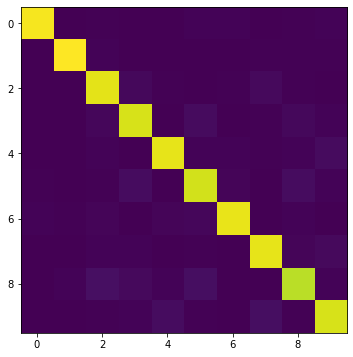

[[0.95 0.   0.   0.   0.   0.01 0.01 0.   0.01 0.01]
 [0.   0.97 0.01 0.   0.   0.   0.   0.01 0.01 0.01]
 [0.   0.   0.93 0.02 0.01 0.   0.01 0.03 0.01 0.  ]
 [0.   0.   0.02 0.91 0.   0.03 0.   0.01 0.02 0.01]
 [0.   0.   0.01 0.   0.93 0.01 0.01 0.01 0.01 0.03]
 [0.01 0.   0.   0.03 0.   0.9  0.01 0.   0.03 0.01]
 [0.01 0.   0.01 0.   0.01 0.02 0.93 0.   0.01 0.  ]
 [0.   0.   0.01 0.01 0.   0.   0.   0.93 0.01 0.02]
 [0.   0.01 0.04 0.02 0.01 0.03 0.   0.   0.87 0.01]
 [0.   0.   0.   0.01 0.03 0.01 0.   0.03 0.   0.91]]

 Accuracy:  0.9225568998819795


In [176]:
# display confusion matrix
""" ==========
YOUR CODE HERE
========== """
M_ran,acc_ran = Confusion(testData, testLabels, linearClassifier)
VisualizeConfusion(M_ran)
print('\n Accuracy: ', acc_ran)

### Part 2: Single Layer Perceptron [2 pts]
The simple linear classifier implemented in the cell already performs quite well. Plot the filter weights corresponding to each output class (weights, not biases) as images. (Normalize weights to lie between 0 and 1 and use color maps like 'inferno' or 'plasma' for good results). Comment on what the weights look like and why that may be so.


torch.Size([10, 784])
Neuron:  0
torch.Size([784])


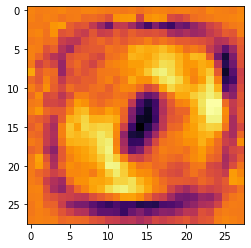

Neuron:  1
torch.Size([784])


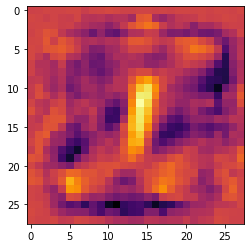

Neuron:  2
torch.Size([784])


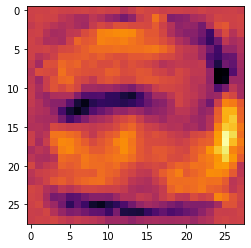

Neuron:  3
torch.Size([784])


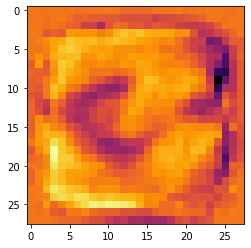

Neuron:  4
torch.Size([784])


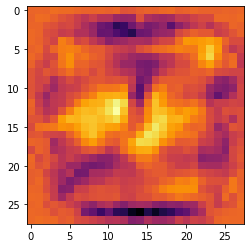

Neuron:  5
torch.Size([784])


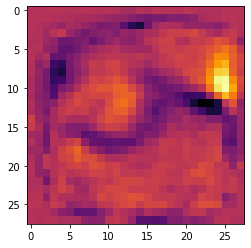

Neuron:  6
torch.Size([784])


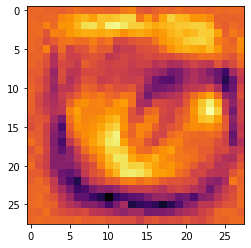

Neuron:  7
torch.Size([784])


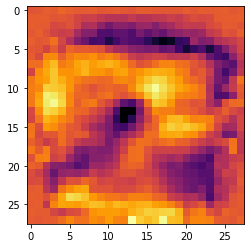

Neuron:  8
torch.Size([784])


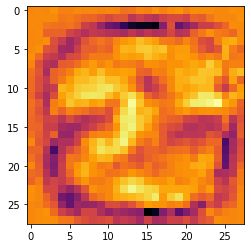

Neuron:  9
torch.Size([784])


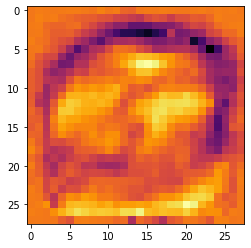

In [188]:
# Plot filter weights corresponding to each class, you may have to reshape them to make sense out of them
# linearClassifier.weight1.data will give you the first layer weights
""" ==========
YOUR CODE HERE
========== """
weights = linearClassifier.weight1.data
print(weights.shape)
for i in range (weights.shape[0]):
    print("Neuron: ", i)
    weight = weights[i, :]
    wMax, wMin = weight.max(), weight.min()
    weight = (weight-wMin)/(wMax-wMin)
    #print(weight.shape)
    weight = weight.reshape(28,28)
    plt.imshow(weight, cmap = 'inferno')
    plt.show()

#### Comments on weights

The weights somewhat resemble the class they are representing, some more than others. For example, the weights for 0, 2, and 3 clearly show evidence visually of the number. The strangest is class 5, as it bears almost no resemblence, and class 4, which again does not really look like the number.
What's interesting is that class 5 has low accuracy of 0.9, but class 8 has the lowest at 0.87, despite looking somewhat like an 8. Clearly the visual appearance of the weights play some role, but the weights and accuracy's have more to them than just visuals.

### Part 3: Multi Layer Perceptron (MLP) [5 pts]
Here you will implement an MLP. The MLP should consist of 2 layers (matrix multiplication and bias offset) that map to the following feature dimensions:

* 28x28 -> hidden (100)
* hidden -> classes

* The hidden layer should be followed with a ReLU nonlinearity. The final layer should not have a nonlinearity applied as we desire the raw logits output.
* The final output of the computation graph should be stored in self.y as that will be used in the training.

Display the confusion matrix and accuracy after training. Note: You should get ~ 97 % accuracy for 10 epochs and batch size 50.

Plot the filter weights corresponding to the mapping from the inputs to the first 10 hidden layer outputs (out of 100). Do the weights look similar to the weights plotted in the previous problem? Why or why not?

In [220]:
class MLPClassifer(DNN):
    def __init__(self, in_features=28*28, classes=10, hidden=100):
        super(MLPClassifer, self).__init__()
        """ ==========
        YOUR CODE HERE
        ========== """
        #2 layers means need to weights, and 2 bias
        self.feat = in_features
        self.numClasses = classes
        self.hidden = hidden
        #wShape1 = (in_features, hidden)
        #wShape2 = (hidden, classes)
        self.wLayer1 = weight_variable((in_features, hidden))
        self.wLayer2 = weight_variable((hidden, classes))
        self.biasInt1 = bias_variable((hidden))
        self.biasInt2 = bias_variable((classes))
    
    def forward(self, x):
        """ ==========
        YOUR CODE HERE
        ========== """
        sz = x.shape
        x = x.reshape((sz[0], self.feat))
        x = F.relu(x@self.wLayer1 +self.biasInt1)
        self.y = x@self.wLayer2 + self.biasInt2
        return self.y
        

mlpClassifer = MLPClassifer()
mlpClassifer.train_net(trainData, trainLabels, epochs=10, batchSize=50)


0it [00:00, ?it/s]
106it [00:00, 1054.14it/s]
200it [00:00, 887.65it/s] 


Epoch:1 Accuracy: 91.360000



0it [00:00, ?it/s]
200it [00:00, 1567.66it/s]


Epoch:2 Accuracy: 93.180000



0it [00:00, ?it/s]
200it [00:00, 1455.77it/s]


Epoch:3 Accuracy: 94.110000



0it [00:00, ?it/s]
200it [00:00, 1422.36it/s]


Epoch:4 Accuracy: 94.850000



0it [00:00, ?it/s]
200it [00:00, 1702.37it/s]


Epoch:5 Accuracy: 95.470000



0it [00:00, ?it/s]
200it [00:00, 1387.18it/s]


Epoch:6 Accuracy: 95.770000



0it [00:00, ?it/s]
200it [00:00, 1663.34it/s]


Epoch:7 Accuracy: 96.230000



0it [00:00, ?it/s]
200it [00:00, 1800.38it/s]


Epoch:8 Accuracy: 96.460000



0it [00:00, ?it/s]
200it [00:00, 1781.89it/s]


Epoch:9 Accuracy: 96.720000



0it [00:00, ?it/s]
200it [00:00, 1698.02it/s]

Epoch:10 Accuracy: 96.910000



0it [00:00, ?it/s]
28it [00:00, 278.02it/s]
58it [00:00, 282.44it/s]
88it [00:00, 285.05it/s]
112it [00:00, 269.52it/s]
135it [00:00, 255.86it/s]
163it [00:00, 261.05it/s]
200it [00:00, 271.50it/s]


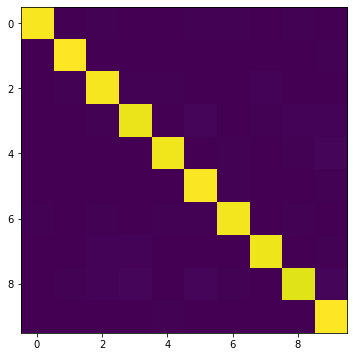

[[0.98 0.   0.01 0.   0.   0.   0.01 0.   0.   0.  ]
 [0.   0.99 0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.97 0.01 0.   0.   0.   0.01 0.   0.  ]
 [0.   0.   0.   0.96 0.   0.01 0.   0.   0.01 0.01]
 [0.   0.   0.   0.   0.96 0.   0.01 0.   0.01 0.02]
 [0.   0.   0.   0.   0.   0.98 0.   0.   0.   0.  ]
 [0.01 0.   0.01 0.   0.01 0.01 0.97 0.   0.   0.  ]
 [0.   0.   0.01 0.01 0.   0.   0.   0.96 0.   0.01]
 [0.   0.01 0.01 0.01 0.   0.01 0.   0.   0.94 0.01]
 [0.   0.   0.   0.   0.01 0.   0.   0.   0.   0.98]]

 Accuracy:  0.9680529648661954


In [213]:
# Plot confusion matrix
""" ==========
YOUR CODE HERE
========== """
M_ran,acc_ran = Confusion(testData, testLabels, mlpClassifer)
VisualizeConfusion(M_ran)
print('\n Accuracy: ', acc_ran)

torch.Size([10, 784])
Neuron:  0


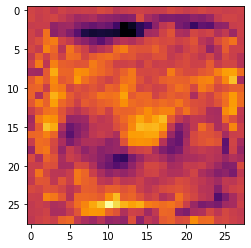

Neuron:  1


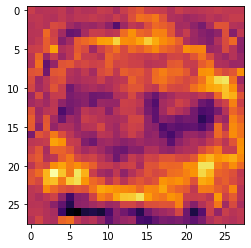

Neuron:  2


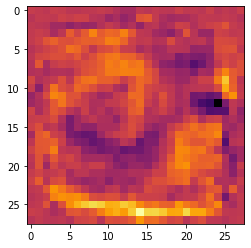

Neuron:  3


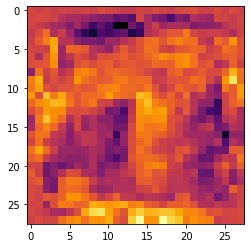

Neuron:  4


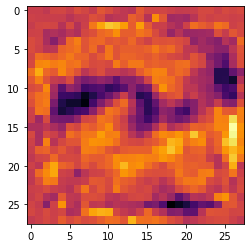

Neuron:  5


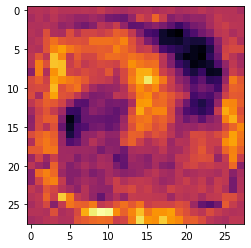

Neuron:  6


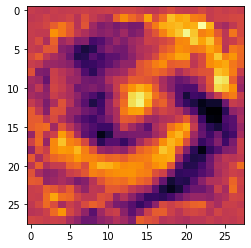

Neuron:  7


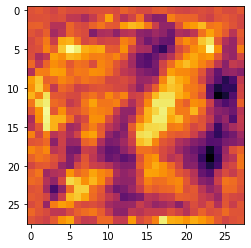

Neuron:  8


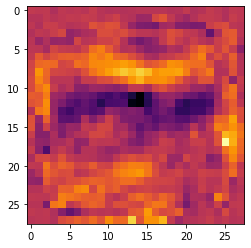

Neuron:  9


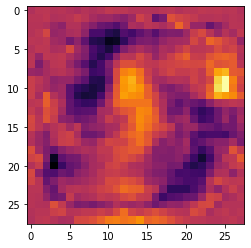

In [221]:
# Plot filter weights
""" ==========
YOUR CODE HERE
========== """
weights = mlpClassifer.wLayer1.data
weights = np.transpose(weights[:, 0:10])
print(weights.shape)
for i in range (weights.shape[0]):
    print("Neuron: ", i)
    weight = weights[i, :]
    wMax, wMin = weight.max(), weight.min()
    weight = (weight-wMin)/(wMax-wMin)
    weight = weight.reshape(28,28)
    plt.imshow(weight, cmap = 'inferno')
    plt.show()
    

#### Comments on weights:
The weights do not much resemble those of the linear classifier. In fact they do not look like visuals of the numbers at all. This is expected as this is a multilayered perceptron, and only the first 10 out of 100 weights are being displayed. As a result the weights will be more intricate than the linear classifier and thus no resemble the numbers as much.




### Part 4: Convolutional Neural Network (CNN) [5 pts]
Here you will implement a CNN with the following architecture:

* n=5
* ReLU( Conv(kernel_size=5x5, stride=2, output_features=n) )
* ReLU( Conv(kernel_size=5x5, stride=2, output_features=n*2) )
* ReLU( Linear(hidden units = 64) )
* Linear(output_features=classes)

So, 2 convolutional layers, followed by 1 fully connected hidden layer and then the output layer

Display the confusion matrix and accuracy after training. You should get around ~ 98 % accuracy for 10 epochs and batch size 50.<br><br>
**Note: You are not allowed to use torch.nn.Conv2d() and torch.nn.Linear(), Using these will lead to deduction of points. Use the declared conv2d(), weight_variable() and bias_variable() functions.** Although, in practice, when you move forward after this class you will use torch.nn.Conv2d() which makes life easier and hides all the operations underneath.

In [232]:
def conv2d(x, W, stride, bias=None):
    # x: input
    # W: weights (out, in, kH, kW)
    return F.conv2d(x, W, bias, stride=stride, padding=2)

# Defining a Convolutional Neural Network
class CNNClassifer(DNN):
    def __init__(self, classes=10, n=5):
        super(CNNClassifer, self).__init__()
        """ ==========
        YOUR CODE HERE
        ========== """
        self.n = n
        self.numClasses = classes
        self.hidden = 64
        # need 2 conv weights, 2 conv bias, 2 linear weights, 2 linear bias
        self.convWeights1 = weight_variable((n,1,5,5))
        self.convWeights2 = weight_variable((2*n, n, 5,5))
        self.convBias1 = bias_variable((1, n, 1,1))
        self.convBias2 = bias_variable((1, 2*n, 1,1))
        
        self.linearWeights1 = weight_variable(( (2*n)*(2+n)*(n+2), self.hidden ))
        self.linearWeights2 = weight_variable(( self.hidden, self.numClasses ))
        self.linearBias1 = bias_variable(( self.hidden ))
        self.linearBias2 = bias_variable(( self.numClasses ))
        
    def forward(self, x):
        """ ==========
        YOUR CODE HERE
        ========== """
        x1 = conv2d(x,self.convWeights1, 2)+self.convBias1
        x1 = F.relu(x1)
        x1 = conv2d(x1,self.convWeights2, 2)+self.convBias2
        #print(x1.shape)
        x1 = F.relu(x1)
        sz = x1.shape
        x1 = x1.view(sz[0],-1)
        #x1 = x1.reshape(sz[0],self.numClasses*sz[2]*sz[3])
        #print(x1.shape)
        #x1= x1.reasdfd
        x1 = x1@self.linearWeights1 +self.linearBias1
        x1 = F.relu(x1)
        x1 = x1@self.linearWeights2 +self.linearBias2
        self.y = x1
        return self.y
        
        
cnnClassifer = CNNClassifer()
cnnClassifer.train_net(trainData, trainLabels, epochs=10)


0it [00:00, ?it/s]
59it [00:00, 584.93it/s]
114it [00:00, 571.15it/s]
200it [00:00, 558.06it/s]


Epoch:1 Accuracy: 91.350000



0it [00:00, ?it/s]
57it [00:00, 565.95it/s]
115it [00:00, 567.96it/s]
200it [00:00, 562.38it/s]


Epoch:2 Accuracy: 93.930000



0it [00:00, ?it/s]
56it [00:00, 554.63it/s]
114it [00:00, 559.24it/s]
200it [00:00, 555.48it/s]


Epoch:3 Accuracy: 95.760000



0it [00:00, ?it/s]
52it [00:00, 519.72it/s]
102it [00:00, 513.02it/s]
148it [00:00, 495.19it/s]
200it [00:00, 477.21it/s]


Epoch:4 Accuracy: 96.420000



0it [00:00, ?it/s]
59it [00:00, 585.34it/s]
117it [00:00, 583.16it/s]
200it [00:00, 568.72it/s]


Epoch:5 Accuracy: 96.870000



0it [00:00, ?it/s]
56it [00:00, 556.86it/s]
113it [00:00, 559.10it/s]
200it [00:00, 558.64it/s]


Epoch:6 Accuracy: 96.890000



0it [00:00, ?it/s]
51it [00:00, 504.30it/s]
109it [00:00, 524.02it/s]
200it [00:00, 546.84it/s]


Epoch:7 Accuracy: 97.540000



0it [00:00, ?it/s]
57it [00:00, 569.49it/s]
116it [00:00, 572.97it/s]
200it [00:00, 572.83it/s]


Epoch:8 Accuracy: 97.770000



0it [00:00, ?it/s]
58it [00:00, 579.53it/s]
115it [00:00, 575.23it/s]
200it [00:00, 565.62it/s]


Epoch:9 Accuracy: 97.840000



0it [00:00, ?it/s]
54it [00:00, 537.17it/s]
105it [00:00, 527.46it/s]
200it [00:00, 516.29it/s]

Epoch:10 Accuracy: 98.070000



0it [00:00, ?it/s]
24it [00:00, 235.04it/s]
49it [00:00, 237.74it/s]
73it [00:00, 236.30it/s]
96it [00:00, 231.14it/s]
119it [00:00, 229.03it/s]
142it [00:00, 227.11it/s]
166it [00:00, 230.14it/s]
200it [00:00, 230.66it/s]


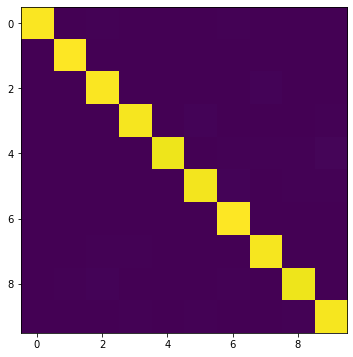

[[0.99 0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.99 0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.99 0.   0.   0.   0.   0.01 0.   0.  ]
 [0.   0.   0.   0.98 0.   0.01 0.   0.   0.   0.  ]
 [0.   0.   0.   0.   0.97 0.   0.01 0.   0.   0.01]
 [0.   0.   0.   0.   0.   0.98 0.01 0.   0.   0.01]
 [0.   0.   0.   0.   0.   0.   0.99 0.   0.   0.  ]
 [0.   0.   0.01 0.   0.   0.   0.   0.98 0.   0.  ]
 [0.   0.   0.01 0.   0.   0.   0.01 0.   0.97 0.  ]
 [0.   0.   0.   0.01 0.   0.   0.   0.   0.   0.98]]

 Accuracy:  0.9805809309153739


In [233]:
# Plot confusion matrix
""" ==========
YOUR CODE HERE
========== """
M_ran,acc_ran = Confusion(testData, testLabels, cnnClassifer)
VisualizeConfusion(M_ran)
print('\n Accuracy: ', acc_ran)

* Note that the MLP/ConvNet approaches lead to an accuracy a little higher than the K-NN approach. 
* In general, Neural net approaches lead to significant increase in accuracy, but in this case since the problem is not too hard, the increase in accuracy is not very high.
* However, this is still quite significant considering the fact that the ConvNets we've used are relatively simple while the accuracy achieved using K-NN is with a search over 60,000 training images for every test image.
* You can look at the performance of various machine learning methods on this problem at http://yann.lecun.com/exdb/mnist/
* You can learn more about neural nets/ pytorch at<br> https://pytorch.org/tutorials/beginner/deep_learning_60min_blitz.html
* You can play with a demo of neural network created by Daniel Smilkov and Shan Carter at https://playground.tensorflow.org/